In [5]:
%%time
# Cell 1: Environment Setup & Dependencies
# ----------------------------------------- 
# Basic Libraries
import os
import random
import time
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from tqdm import tqdm
from PIL import Image
import seaborn as sns
import networkx as nx
import cv2

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision import models
from torchvision.models import resnet50, ResNet50_Weights
from torchvision.io import read_video
from torchvision.transforms import ToTensor, Normalize, Resize, Compose, RandomHorizontalFlip

# PyTorch Geometric (Graph Neural Networks)
import torch_geometric
from torch_geometric.nn import GCNConv, EdgeConv
from torch_geometric.data import Data, Batch
from torch_geometric.utils import to_dense_adj

# Evaluation Metrics
from sklearn.metrics import average_precision_score, accuracy_score, precision_score, recall_score, f1_score

# Configure for maximum GPU utilization
torch.backends.cudnn.benchmark = True
torch.set_float32_matmul_precision('high')  # Enable Tensor Cores

# Multi-GPU setup
num_gpus = torch.cuda.device_count()
device = torch.device('cuda' if num_gpus else 'cpu')

# Set memory fraction directly (0.9 = 90% of available memory)
for gpu_idx in range(num_gpus):
    torch.cuda.set_per_process_memory_fraction(0.9, device=gpu_idx)

# Configure environment
os.environ["CUDA_VISIBLE_DEVICES"] = ",".join(map(str, range(num_gpus)))
os.environ["NCCL_DEBUG"] = "INFO"

print(f"\n{'='*40}\nGPU Configuration:")
print(f"Available GPUs: {num_gpus}")
print(f"Memory per GPU: {0.9*11:.1f}GB (90% of 11GB)")
print(f"PyTorch Version: {torch.__version__}")
print(f"CUDA Version: {torch.version.cuda}")


GPU Configuration:
Available GPUs: 3
Memory per GPU: 9.9GB (90% of 11GB)
PyTorch Version: 1.13.1+cu117
CUDA Version: 11.7
CPU times: user 379 µs, sys: 199 µs, total: 578 µs
Wall time: 539 µs


In [6]:
# Multi-GPU training configuration
import torch.multiprocessing as mp
import torch.distributed as dist
from torch.nn.parallel import DataParallel

def setup_multi_gpu():
    """Configure all available GPUs for training"""
    # Check available GPUs
    num_gpus = torch.cuda.device_count()
    if num_gpus <= 1:
        print("No multiple GPUs available. Using single GPU or CPU.")
        return 0
    
    # Get memory info for all GPUs
    gpu_memory = []
    for i in range(num_gpus):
        free_mem = torch.cuda.get_device_properties(i).total_memory - torch.cuda.memory_allocated(i)
        free_mem_gb = free_mem / (1024**3)
        gpu_memory.append((i, free_mem_gb))
    
    # Sort by available memory (descending)
    gpu_memory.sort(key=lambda x: x[1], reverse=True)
    
    # Select GPUs with more than 1GB free memory
    available_gpus = [idx for idx, mem in gpu_memory if mem > 1.0]
    
    if not available_gpus:
        print("No GPUs with sufficient memory available.")
        return 0
    
    # Set visible devices to available ones
    available_gpu_ids = ",".join(map(str, available_gpus))
    os.environ["CUDA_VISIBLE_DEVICES"] = available_gpu_ids
    print(f"Using {len(available_gpus)} GPUs with IDs: {available_gpu_ids}")
    
    # Set memory fraction to avoid OOM
    for gpu_idx in available_gpus:
        torch.cuda.set_per_process_memory_fraction(0.85, device=gpu_idx)
    
    return len(available_gpus)

# Run setup
num_available_gpus = setup_multi_gpu()
print(f"Training with {num_available_gpus} GPUs")

Using 3 GPUs with IDs: 0,1,2
Training with 3 GPUs


Train Set:
  Total images: 32621
  Unique identities: 1041
  Unique cameras: 15
Test Set:
  Total images: 82161
  Unique identities: 3060
  Unique cameras: 15
Query Set:
  Total images: 11659
  Unique identities: 3060
  Unique cameras: 15

Training Set Visualization:


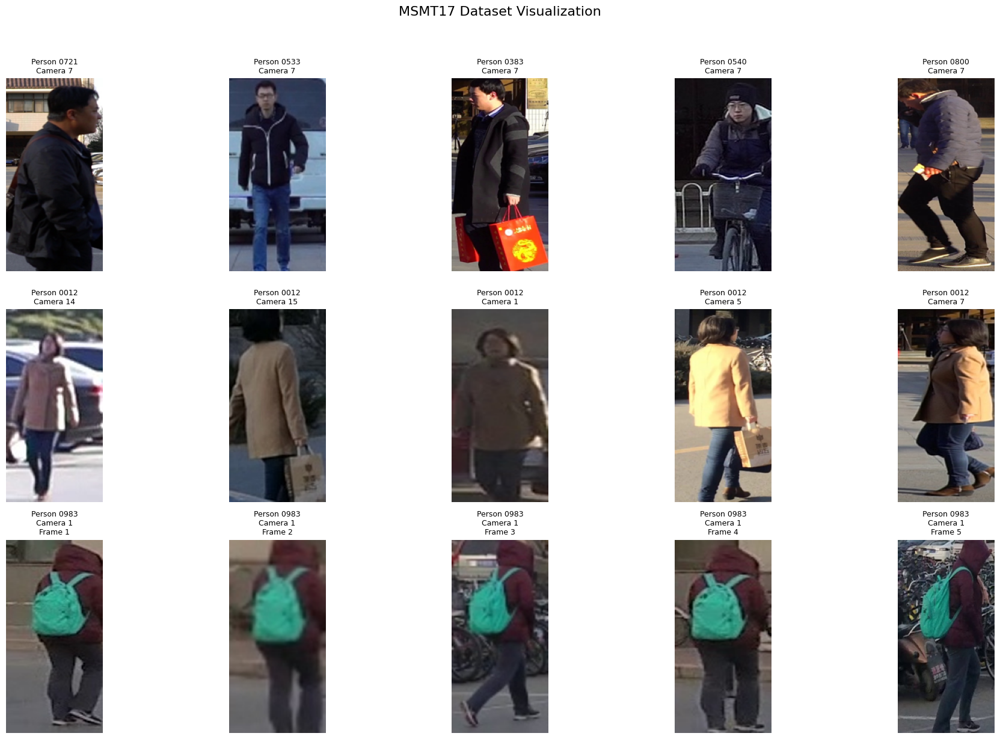

In [7]:
# Cell 2: Dataset Visualization & Analysis
# -----------------------------------------
#Dataset Visualization & Analysis
def analyze_msmt_structure(directory):
    """Analyze MSMT17 dataset structure and return statistics"""
    files = [f for f in os.listdir(directory) if f.endswith('.jpg')]
    person_ids = set()
    camera_ids = set()
    pid_cam_counts = defaultdict(lambda: defaultdict(int))
    
    for filename in files:
        parts = filename.split('_')
        if len(parts) < 2:
            continue  # Skip invalid filenames
            
        pid = parts[0]
        cam_id = parts[1][1:]  # Remove 'c' prefix from camera ID
        person_ids.add(pid)
        camera_ids.add(cam_id)
        pid_cam_counts[pid][cam_id] += 1
    
    return {
        'total_images': len(files),
        'num_identities': len(person_ids),
        'num_cameras': len(camera_ids),
        'pid_cam_counts': pid_cam_counts
    }

def visualize_msmt_samples(directory, num_samples=5):
    """Visualize samples showing:
    1. Different people in same camera
    2. Same person across different cameras
    3. Same person from same camera (multiple images)
    """
    # Collect data
    cam_person = defaultdict(lambda: defaultdict(list))
    person_cams = defaultdict(lambda: defaultdict(list))
    
    for filename in os.listdir(directory):
        if not filename.endswith('.jpg'):
            continue
            
        parts = filename.split('_')
        if len(parts) < 2:
            continue
            
        pid = parts[0]
        cam_id = parts[1][1:]  # Remove 'c' prefix
        img_path = os.path.join(directory, filename)
        
        # Store multiple images per person-camera pair (for same-person-same-camera)
        cam_person[cam_id][pid].append(img_path)
        
        # For other visualizations, keep first image only
        if not person_cams[pid][cam_id]:
            person_cams[pid][cam_id] = img_path

    # Create visualization with 3 rows
    fig, axs = plt.subplots(3, num_samples, figsize=(20, 12))
    plt.suptitle("MSMT17 Dataset Visualization", fontsize=16, y=1.02)
    
    # Visualization 1: Different people in same camera
    valid_cams = [cam for cam in cam_person if len(cam_person[cam]) >= num_samples]
    if valid_cams:
        selected_cam = random.choice(valid_cams)
        samples = random.sample(list(cam_person[selected_cam].keys()), num_samples)
        
        for idx, pid in enumerate(samples):
            img = Image.open(person_cams[pid][selected_cam]).resize((128, 256))
            axs[0, idx].imshow(img)
            axs[0, idx].set_title(f"Person {pid}\nCamera {selected_cam}", fontsize=9)
            axs[0, idx].axis('off')
    else:
        axs[0, 0].text(0.5, 0.5, "No camera with enough different people", 
                   ha='center', va='center')
        axs[0, 0].axis('off')

    # Visualization 2: Same person across different cameras
    valid_persons = [pid for pid in person_cams if len(person_cams[pid]) >= 3]
    if valid_persons:
        selected_pid = random.choice(valid_persons)
        cams = list(person_cams[selected_pid].keys())[:num_samples]
        
        for idx, cam_id in enumerate(cams):
            img = Image.open(person_cams[selected_pid][cam_id]).resize((128, 256))
            axs[1, idx].imshow(img)
            axs[1, idx].set_title(f"Person {selected_pid}\nCamera {cam_id}", fontsize=9)
            axs[1, idx].axis('off')
    else:
        axs[1, 0].text(0.5, 0.5, "No person with enough camera views", 
                   ha='center', va='center')
        axs[1, 0].axis('off')
    
    # Visualization 3: Same person from same camera (multiple images)
    # Find person-camera pairs with multiple images
    candidates = []
    for cam_id, persons in cam_person.items():
        for pid, images in persons.items():
            if len(images) >= num_samples:
                candidates.append((pid, cam_id, images))
    
    if candidates:
        selected = random.choice(candidates)
        pid, cam_id, images = selected
        sample_images = random.sample(images, num_samples)
        
        for idx, img_path in enumerate(sample_images):
            img = Image.open(img_path).resize((128, 256))
            axs[2, idx].imshow(img)
            axs[2, idx].set_title(f"Person {pid}\nCamera {cam_id}\nFrame {idx+1}", fontsize=9)
            axs[2, idx].axis('off')
    else:
        axs[2, 0].text(0.5, 0.5, "No person with enough images from same camera", 
                  ha='center', va='center')
        axs[2, 0].axis('off')

    # Make sure all empty subplot slots are turned off
    for row in range(3):
        for col in range(num_samples):
            if not axs[row, col].has_data() and not axs[row, col].texts:
                axs[row, col].axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()
# Dataset paths
train_dir = "dataset/MSMT17/bounding_box_train"
test_dir = "dataset/MSMT17/bounding_box_test"
query_dir = "dataset/MSMT17/query" 

# Print dataset statistics
for name, path in [('Train', train_dir), ('Test', test_dir), ('Query', query_dir)]:
    stats = analyze_msmt_structure(path)
    print(f"{name} Set:")
    print(f"  Total images: {stats['total_images']}")
    print(f"  Unique identities: {stats['num_identities']}")
    print(f"  Unique cameras: {stats['num_cameras']}") 

# Visualize samples from training set
print("\nTraining Set Visualization:")
visualize_msmt_samples(train_dir)

Found 3555 sequences with 4+ frames of same person/same camera

Sequence 1: Person 0000, Camera 12, 6 frames


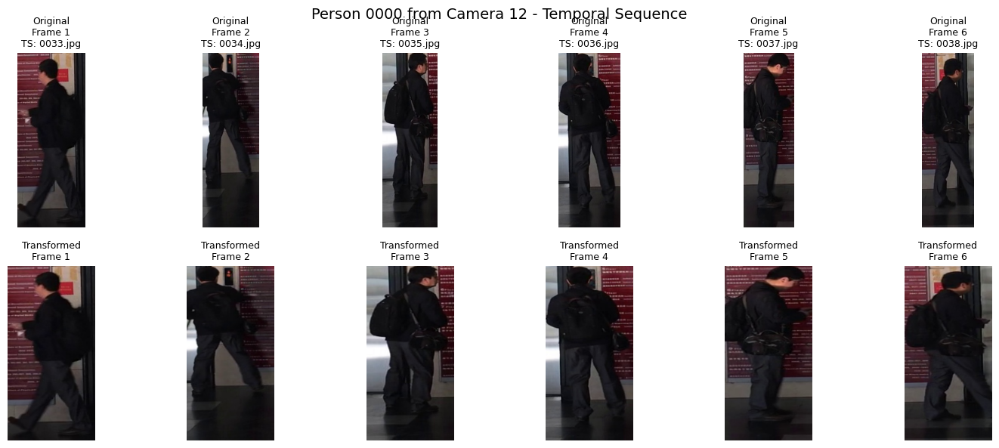

Transformed tensor shape: torch.Size([3, 256, 128])

Sequence 2: Person 0000, Camera 1, 6 frames


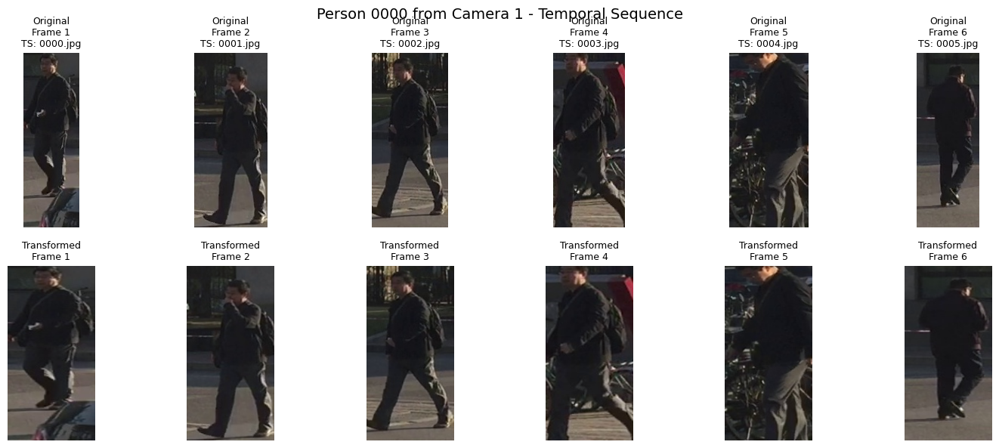

Transformed tensor shape: torch.Size([3, 256, 128])

Sequence 3: Person 0000, Camera 4, 6 frames


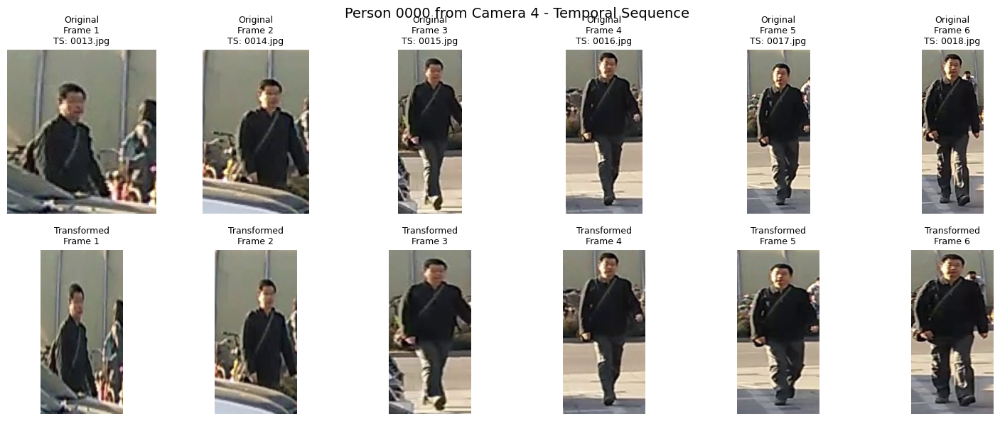

Transformed tensor shape: torch.Size([3, 256, 128])


In [8]:
# Cell 3: Standard ReID Transformations with Visualization
# ---------------------------------------------------------

# Import torchvision.transforms as T
import torchvision.transforms as T

# Define core transformations
train_transform = T.Compose([
    T.Resize((256, 128)),  # Fixed input size
    T.RandomHorizontalFlip(p=0.5),  # Data augmentation
    T.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],  # ImageNet stats
                std=[0.229, 0.224, 0.225])
])

test_transform = T.Compose([
    T.Resize((256, 128)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225])
])
def find_same_person_same_camera_sequences(directory, min_frames=4, max_frames=8):
    """
    Find image sequences of the same person from the same camera
    
    Args:
        directory: Path to dataset directory
        min_frames: Minimum frames required in a sequence
        max_frames: Maximum frames to include in a sequence
        
    Returns:
        List of tuples (person_id, camera_id, [sorted_image_paths])
    """
    # Group images by person-camera pairs
    sequences = defaultdict(lambda: defaultdict(list))
    
    for filename in os.listdir(directory):
        if not filename.endswith('.jpg'):
            continue
            
        parts = filename.split('_')
        if len(parts) < 3:
            continue
            
        pid = parts[0]
        cam_id = parts[1][1:]  # Remove 'c' prefix
        
        # Get timestamp for sorting
        timestamp = int(parts[2]) if parts[2].isdigit() else 0
        img_path = os.path.join(directory, filename)
        
        sequences[pid][cam_id].append((img_path, timestamp, filename))
    
    # Filter for sequences with enough frames and sort by timestamp
    valid_sequences = []
    
    for pid, cameras in sequences.items():
        for cam_id, images in cameras.items():
            if len(images) >= min_frames:
                # Sort by timestamp
                sorted_images = sorted(images, key=lambda x: x[1])
                # Extract only image paths and limit to max_frames
                image_paths = [img[0] for img in sorted_images[:max_frames]]
                valid_sequences.append((pid, cam_id, image_paths))
    
    return valid_sequences

def inverse_transform(tensor):
    """
    Convert a normalized tensor back to a PIL image for visualization.
    
    Args:
        tensor: Normalized image tensor with ImageNet stats
        
    Returns:
        PIL Image
    """
    # Create a clone to avoid modifying the original tensor
    img = tensor.clone().detach().cpu()
    
    # Undo normalization (ImageNet stats)
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    
    img = img * std + mean
    
    # Clamp values to [0, 1]
    img = torch.clamp(img, 0, 1)
    
    # Convert to PIL image
    img = img.permute(1, 2, 0).numpy() * 255
    return Image.fromarray(img.astype('uint8'))

def visualize_temporal_transformations(sequence_info, transform):
    """
    Visualize original and transformed images of the same person
    from the same camera across multiple frames
    
    Args:
        sequence_info: Tuple (person_id, camera_id, [image_paths])
        transform: Transformation pipeline to apply
    """
    pid, cam_id, image_paths = sequence_info
    num_frames = len(image_paths)
    
    # Create figure with two rows (original and transformed)
    fig, axes = plt.subplots(2, num_frames, figsize=(num_frames * 2.5, 6))
    fig.suptitle(f"Person {pid} from Camera {cam_id} - Temporal Sequence", fontsize=14)
    
    # Process each image in the sequence
    for i, img_path in enumerate(image_paths):
        # Get original image
        orig_img = Image.open(img_path).convert('RGB')
        
        # Get transformed tensor
        trans_tensor = transform(orig_img)
        
        # Convert transformed tensor back to image for visualization
        trans_img = inverse_transform(trans_tensor)
        
        # Extract timestamp from filename
        timestamp = os.path.basename(img_path).split('_')[2]
        
        # Plot original image
        axes[0, i].imshow(orig_img)
        axes[0, i].set_title(f"Original\nFrame {i+1}\nTS: {timestamp}", fontsize=9)
        axes[0, i].axis('off')
        
        # Plot transformed image
        axes[1, i].imshow(trans_img)
        axes[1, i].set_title(f"Transformed\nFrame {i+1}", fontsize=9)
        axes[1, i].axis('off')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()
    
    return [transform(Image.open(img_path).convert('RGB')) for img_path in image_paths]

# Find sequences of the same person from the same camera
train_dir = "dataset/MSMT17/bounding_box_train"
sequences = find_same_person_same_camera_sequences(train_dir, min_frames=4, max_frames=6)

# Print sequence statistics
num_sequences = len(sequences)
print(f"Found {num_sequences} sequences with 4+ frames of same person/same camera")

# Visualize a few example sequences
for i, seq_info in enumerate(sequences[:3]):
    pid, cam_id, paths = seq_info
    print(f"\nSequence {i+1}: Person {pid}, Camera {cam_id}, {len(paths)} frames")
    # Visualize with standard ReID transformations
    transformed_tensors = visualize_temporal_transformations(seq_info, test_transform)
    
    # You can store these tensors for further processing in your temporal GCN model
    print(f"Transformed tensor shape: {transformed_tensors[0].shape}")

/home/cs25s002/.venv/lib/python3.7/site-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and may be removed in the future, "
/home/cs25s002/.venv/lib/python3.7/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Feature Map Details:
Total feature maps: 2048
Spatial dimensions: 16x8
Min value: 0.0000
Max value: 11.6518
Mean value: 0.3051


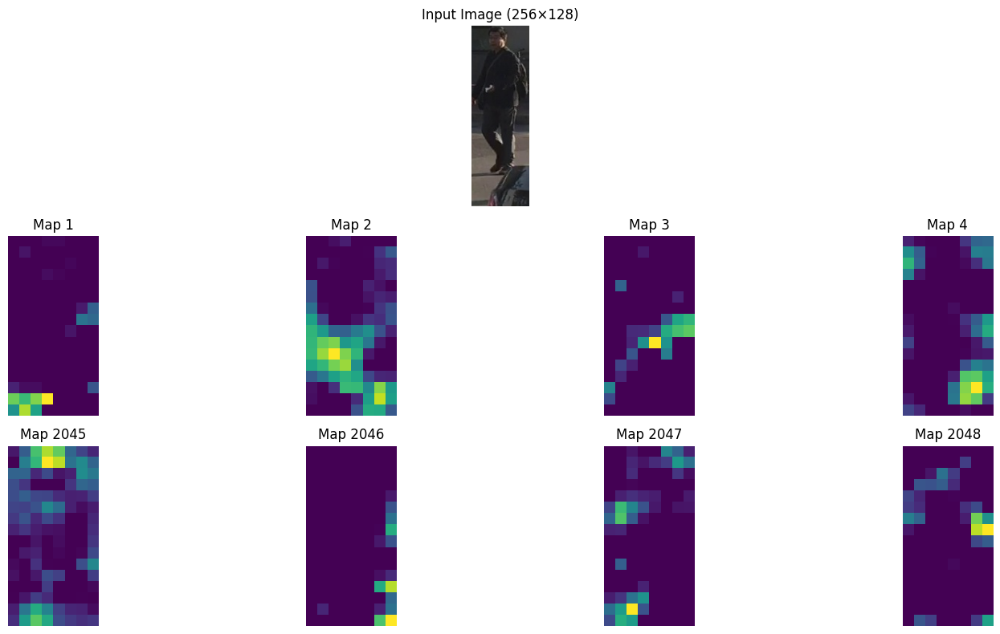

In [9]:
# Cell 4: Backbone Feature Extraction (Paper Section 3.1)
# --------------------------------------------------------

# Paper-specified ResNet50 modification
class STGCNBackbone(nn.Module):
    def __init__(self):
        super().__init__()
        base = resnet50(pretrained=True)
        
        # Remove final layers
        self.features = nn.Sequential(*list(base.children())[:-2])
        
        # Critical stride modification from paper
        layer4 = self.features[7]
        layer4[0].conv1.stride = (1, 1)
        layer4[0].conv2.stride = (1, 1)
        layer4[0].downsample[0].stride = (1, 1)

    def forward(self, x):
        return self.features(x)

# Initialize backbone
backbone = STGCNBackbone().to(device).eval()

# Process sample image
sample_path = "dataset/MSMT17/bounding_box_train/0000_c1_0000.jpg"
img = Image.open(sample_path).convert('RGB')
img_tensor = transforms.Compose([
    transforms.Resize((256, 128)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])(img).unsqueeze(0).to(device)

# Extract features (paper equation 1)
with torch.no_grad():
    feature_maps = backbone(img_tensor)

# Paper-specified feature map details
print("Feature Map Details:")
print(f"Total feature maps: {feature_maps.size(1)}")  # 2048 channels
print(f"Spatial dimensions: {feature_maps.size(2)}x{feature_maps.size(3)}")  # 16x8
print(f"Min value: {feature_maps.min().item():.4f}")
print(f"Max value: {feature_maps.max().item():.4f}")
print(f"Mean value: {feature_maps.mean().item():.4f}")

# Visualization (Paper Figure 2 style)
def paper_visualization(original_img, features, num_maps=8):
    plt.figure(figsize=(15, 8))
    
    # Original Image
    plt.subplot(3, 1, 1)
    plt.imshow(original_img)
    plt.title("Input Image (256×128)")
    plt.axis('off')
    
    # First 4 feature maps
    for i in range(4):
        plt.subplot(3, 4, 4+i+1)
        plt.imshow(features[0, i].cpu().numpy(), cmap='viridis')
        plt.title(f"Map {i+1}")
        plt.axis('off')
    
    # Last 4 feature maps
    for i in range(4):
        plt.subplot(3, 4, 8+i+1)
        plt.imshow(features[0, 2044+i].cpu().numpy(), cmap='viridis')
        plt.title(f"Map {2045+i}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Generate visualization
paper_visualization(img, feature_maps)

Backbone output shape: torch.Size([1, 2048, 16, 8])

Visualizing features for: 0823_c1_0000.jpg


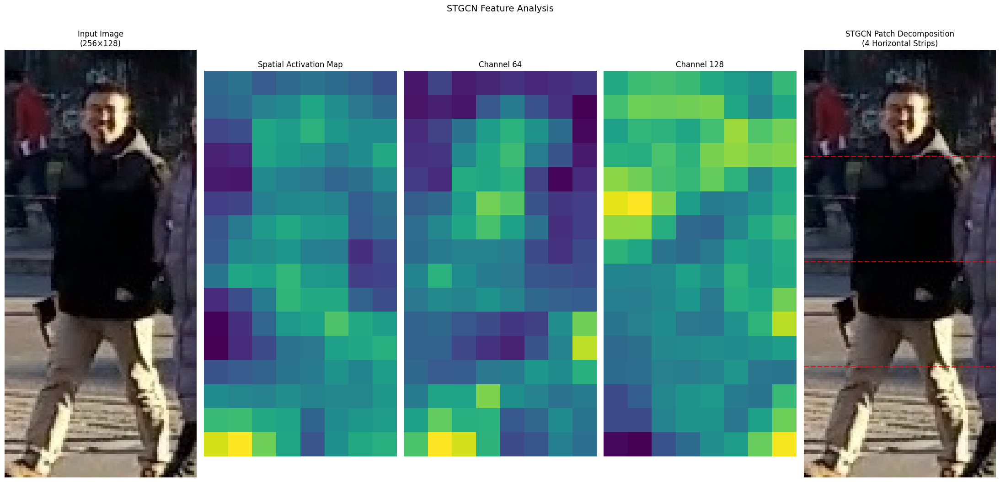


Feature Analysis:
Shape: (2048, 16, 8) (C, H, W)
Activation Range: -0.14 to 0.23
Each spatial position covers 16x16 = 16x16 pixels

Horizontal Partitioning & Average Pooling Output:
Input feature map shape: torch.Size([1, 2048, 16, 8])
Output pooled features shape: torch.Size([1, 4, 2048])
Number of partitions (P): 4

Statistics per partition:
  Partition 1:
    Mean activation: 0.3118
    Min: 0.0000
    Max: 4.3983
  Partition 2:
    Mean activation: 0.2762
    Min: 0.0000
    Max: 5.3879
  Partition 3:
    Mean activation: 0.2536
    Min: 0.0000
    Max: 6.2025
  Partition 4:
    Mean activation: 0.3786
    Min: 0.0000
    Max: 3.2252


In [10]:
# Cell 5: STGCN Feature Map Visualization & Backbone Verification
# ----------------------------------------------------------------------
import torchvision

def create_stgcn_backbone():
    """Create modified ResNet50 backbone as per STGCN paper specifications"""
    model = torchvision.models.resnet50(pretrained=True)
    
    # Remove stride reduction in layer4 to maintain spatial resolution
    for block in model.layer4.children():
        if isinstance(block, torchvision.models.resnet.Bottleneck):
            # Modify all convolutional layers in Bottleneck
            block.conv1.stride = (1, 1)
            block.conv2.stride = (1, 1)
            if block.downsample is not None:
                block.downsample[0].stride = (1, 1)
    
    # Remove final layers (avgpool and fc)
    backbone = nn.Sequential(*list(model.children())[:-2])
    return backbone

# -------------------------------------------------------------------
# Feature Map Visualization with Patch Analysis
def visualize_stgcn_features(backbone, img_path, transform, device):
    """Visualizes feature maps with STGCN's horizontal patch decomposition"""
    # Load and process image
    img = Image.open(img_path).convert('RGB')
    img_tensor = transform(img).unsqueeze(0).to(device)
    
    # Setup activation hook
    activations = {}
    def hook_fn(module, input, output):
        activations['features'] = output.detach()
    
    # Register hook at final convolutional layer (layer4[2].conv3)
    backbone[-1][-1].conv3.register_forward_hook(hook_fn)
    
    # Forward pass
    with torch.no_grad():
        _ = backbone(img_tensor)
    
    # Extract and process features
    features = activations['features'].squeeze().cpu().numpy()
    
    # Visualization
    plt.figure(figsize=(22, 10))
    plt.suptitle("STGCN Feature Analysis", fontsize=14, y=1.05)
    
    # Original Image
    plt.subplot(1, 5, 1)
    plt.imshow(img)
    plt.title("Input Image\n(256×128)")
    plt.axis('off')
    
    # Channel Mean Activation
    plt.subplot(1, 5, 2)
    plt.imshow(np.mean(features, axis=0), cmap='viridis')
    plt.title("Spatial Activation Map")
    plt.axis('off')
    
    # High-response Channels
    for i, idx in enumerate([64, 128, 192], 3):
        plt.subplot(1, 5, i)
        plt.imshow(features[idx], cmap='viridis')
        plt.title(f"Channel {idx}")
        plt.axis('off')
    
    # STGCN Patch Division
    plt.subplot(1, 5, 5)
    plt.imshow(img)
    plt.title("STGCN Patch Decomposition\n(4 Horizontal Strips)")
    for y in [img.height//4*i for i in range(1,4)]:
        plt.axhline(y, color='r', linestyle='--', linewidth=2, alpha=0.8)
    plt.axis('off')

    plt.tight_layout()
    plt.show()
    
    return features

# -------------------------------------------------------------------
# Initialization and Verification
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Create and verify backbone
stgcn_backbone = create_stgcn_backbone().to(device).eval()

# Transformation pipeline (matches training preprocessing)
stgcn_transform = transforms.Compose([
    transforms.Resize((256, 128)),  # STGCN input size
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Verify feature map dimensions
test_input = torch.randn(1, 3, 256, 128).to(device)
with torch.no_grad():
    test_output = stgcn_backbone(test_input)
print(f"Backbone output shape: {test_output.shape}")  # Should be [1, 2048, 16, 8]

# Visualize sample from MSMT17 dataset
train_dir = "dataset/MSMT17/bounding_box_train"
sample_img = os.path.join(train_dir, random.choice(os.listdir(train_dir)))
print(f"\nVisualizing features for: {os.path.basename(sample_img)}")

feature_maps = visualize_stgcn_features(stgcn_backbone, sample_img, stgcn_transform, device)

# Feature statistics
print("\nFeature Analysis:")
print(f"Shape: {feature_maps.shape} (C, H, W)")
print(f"Activation Range: {feature_maps.min():.2f} to {feature_maps.max():.2f}")
print(f"Each spatial position covers {256//16}x{128//8} = 16x16 pixels") 

def horizontal_partition_and_pool(feature_maps, P=4):
    """
    Implements paper's horizontal partitioning and pooling:
    1. Divides feature maps into P horizontal strips
    2. Applies spatial average pooling for each partition
    
    Args:
        feature_maps: Tensor of shape [B, C, H, W]
        P: Number of horizontal partitions
    
    Returns:
        Pooled features of shape [B, P, C]
    """
    B, C, H, W = feature_maps.shape
    
    # Split feature maps into P horizontal partitions
    partition_height = H // P
    pooled_partitions = []
    
    for i in range(P):
        # Extract horizontal strip
        start_h = i * partition_height
        end_h = (i+1) * partition_height if i < P-1 else H
        strip = feature_maps[:, :, start_h:end_h, :]
        
        # Apply spatial average pooling
        pooled = strip.mean(dim=(2, 3))  # [B, C]
        pooled_partitions.append(pooled)
    
    # Stack along new dimension
    return torch.stack(pooled_partitions, dim=1)  # [B, P, C]

# Load sample image
sample_path = "dataset/MSMT17/bounding_box_train/0000_c1_0000.jpg"
img = Image.open(sample_path).convert('RGB')
img_tensor = stgcn_transform(img).unsqueeze(0).to(device)

# Get feature maps
with torch.no_grad():
    feature_maps = stgcn_backbone(img_tensor)

# Apply horizontal partitioning and pooling
P = 4  # Number of partitions as in paper
pooled_features = horizontal_partition_and_pool(feature_maps, P)

# Print output shape and statistics
print(f"\nHorizontal Partitioning & Average Pooling Output:")
print(f"Input feature map shape: {feature_maps.shape}")  # [1, 2048, 16, 8]
print(f"Output pooled features shape: {pooled_features.shape}")  # [1, 4, 2048]
print(f"Number of partitions (P): {P}")

# Statistics per partition
print("\nStatistics per partition:")
for i in range(P):
    partition_features = pooled_features[0, i]
    print(f"  Partition {i+1}:")
    print(f"    Mean activation: {partition_features.mean().item():.4f}")
    print(f"    Min: {partition_features.min().item():.4f}")
    print(f"    Max: {partition_features.max().item():.4f}")


Visualizing STGCN Spatial Relationships:


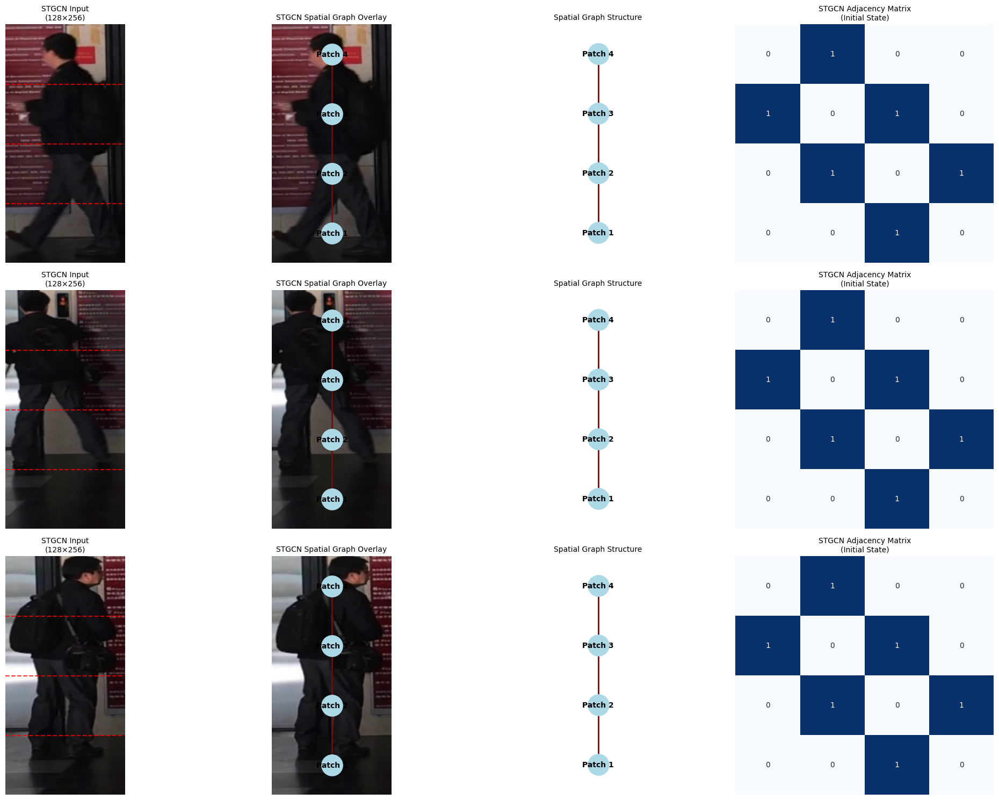

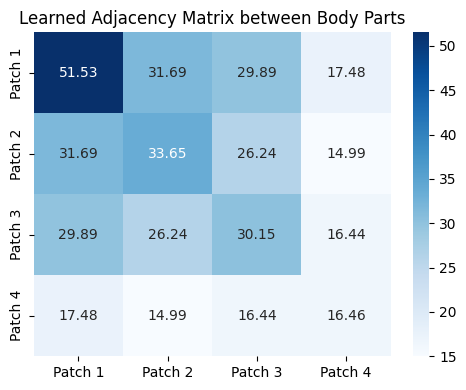

In [11]:
# Cell 6: STGCN Spatial Graph Visualization
# ----------------------------------------------------------------------

def visualize_spatial_graphs(transformed_batch, device, num_patches=4):
    """STGCN Spatial Relationship Visualization with 4 Columns:
    1. Normalized Input 2. Graph Overlay 3. Pure Graph 4. Adjacency Matrix
    """
    num_images = len(transformed_batch)
    fig, axs = plt.subplots(num_images, 4, figsize=(20, 5*num_images))
    if num_images == 1:
        axs = [axs]  # Ensure 2D indexing

    # Inverse normalization for visualization
    inv_normalize = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )

    for img_idx, (img_tensor, ax_row) in enumerate(zip(transformed_batch, axs)):
        # --------------------------------------------------
        # Column 1: Preprocessed Image with Patch Boundaries
        # --------------------------------------------------
        img_denorm = inv_normalize(img_tensor.cpu()).clamp(0,1)
        img_pil = transforms.ToPILImage()(img_denorm.squeeze())
        ax_row[0].imshow(img_pil)
        ax_row[0].set_title(f"STGCN Input\n({img_pil.size[0]}×{img_pil.size[1]})", fontsize=10)
        for y in [img_pil.height//num_patches*i for i in range(1,num_patches)]:
            ax_row[0].axhline(y, color='r', linestyle='--', linewidth=1.5, alpha=0.8)

        # --------------------------------------------------
        # Column 2: Spatial Graph Overlay (Paper Fig 4b)
        # --------------------------------------------------
        G = nx.Graph()
        node_positions = {i: (img_pil.width//2, 
                            img_pil.height - (i+0.5)*img_pil.height/num_patches)
                          for i in range(num_patches)}
        
        # STGCN-style connections (bidirectional edges)
        for i in range(num_patches):
            G.add_node(i, label=f"Patch {i+1}")
            if i > 0:
                G.add_edge(i, i-1)  # Connect to previous patch
            if i < num_patches-1:
                G.add_edge(i, i+1)  # Connect to next patch

        nx.draw(G, node_positions, ax=ax_row[1], 
               node_size=800, node_color='lightblue',
               edge_color='darkred', width=2,
               labels={n: G.nodes[n]['label'] for n in G.nodes},
               font_size=10, font_weight='bold')
        ax_row[1].imshow(img_pil)
        ax_row[1].set_title("STGCN Spatial Graph Overlay", fontsize=10)

        # --------------------------------------------------
        # Column 3: Isolated Graph Structure (Paper Fig 2)
        # --------------------------------------------------
        nx.draw(G, node_positions, ax=ax_row[2],
               node_size=800, node_color='lightblue',
               edge_color='darkred', width=2,
               labels={n: G.nodes[n]['label'] for n in G.nodes},
               font_size=10, font_weight='bold')
        ax_row[2].set_facecolor('white')
        ax_row[2].set_title("Spatial Graph Structure", fontsize=10)
        ax_row[2].set_xlim(0, img_pil.width)
        ax_row[2].set_ylim(0, img_pil.height)
        ax_row[2].invert_yaxis()  # Match image coordinate system

        # --------------------------------------------------
        # Column 4: Learnable Adjacency Matrix (Paper Eq 2)
        # --------------------------------------------------
        adj_matrix = nx.adjacency_matrix(G).todense()
        sns.heatmap(adj_matrix, annot=True, fmt="d", cmap="Blues",
                    ax=ax_row[3], cbar=False,
                    xticklabels=[f"P{i+1}" for i in range(num_patches)],
                    yticklabels=[f"P{i+1}" for i in range(num_patches)])
        ax_row[3].set_title("STGCN Adjacency Matrix\n(Initial State)", fontsize=10)
        ax_row[3].set_xlabel("Target Patches", fontsize=8)
        ax_row[3].set_ylabel("Source Patches", fontsize=8)

        # Formatting
        for ax in ax_row:
            ax.axis('off')
            ax.grid(False)

    plt.tight_layout()
    plt.show()

# ----------------------------------------------------------------------
# Execution with sample images

# Get 3 sample images for visualization
train_dir = "dataset/MSMT17/bounding_box_train"
sample_paths = []
for filename in sorted(os.listdir(train_dir))[:3]:  # Take first 3 images
    if filename.endswith('.jpg'):
        sample_paths.append(os.path.join(train_dir, filename))

# Create tensor batch with transformations
sample_tensors = []
for img_path in sample_paths:
    img = Image.open(img_path).convert('RGB')
    tensor = stgcn_transform(img)
    sample_tensors.append(tensor)

print("Visualizing STGCN Spatial Relationships:")
visualize_spatial_graphs(sample_tensors, device)

# ----------------------------------------------------------------------
# Create a simple spatial graph model component
class SpatialGraphModule(nn.Module):
    def __init__(self, feature_dim=2048, hidden_dim=256):
        super().__init__()
        self.embedding = nn.Linear(feature_dim, hidden_dim, bias=False)
        
    def forward(self, x):
        """Compute adjacency matrix from embeddings"""
        # x: [B, P, C]
        emb = self.embedding(x)  # [B, P, hidden_dim]
        adj = torch.bmm(emb, emb.transpose(1, 2))  # [B, P, P]
        return adj

# Process first sample image through backbone to get features
img_tensor = sample_tensors[0].unsqueeze(0).to(device)
with torch.no_grad():
    feature_maps = stgcn_backbone(img_tensor)

# Apply horizontal partitioning and pooling using function from Cell 5
P = 4  # Number of horizontal partitions
pooled_features = horizontal_partition_and_pool(feature_maps, P=P)

# Initialize and apply
spatial_graph = SpatialGraphModule().to(device)
with torch.no_grad():
    adjacency = spatial_graph(pooled_features)

# Visualize the learned adjacency matrix
plt.figure(figsize=(5, 4))
plt.subplot(1, 1, 1)
sns.heatmap(adjacency.cpu().squeeze().detach().numpy(), 
            annot=True, fmt=".2f", cmap="Blues",
            xticklabels=[f"Patch {i+1}" for i in range(P)],
            yticklabels=[f"Patch {i+1}" for i in range(P)])
plt.title("Learned Adjacency Matrix between Body Parts")
plt.tight_layout()
plt.show()

Visualizing STGCN Temporal Connections:
Selected sequence: Person 0000, Camera 12, 6 frames


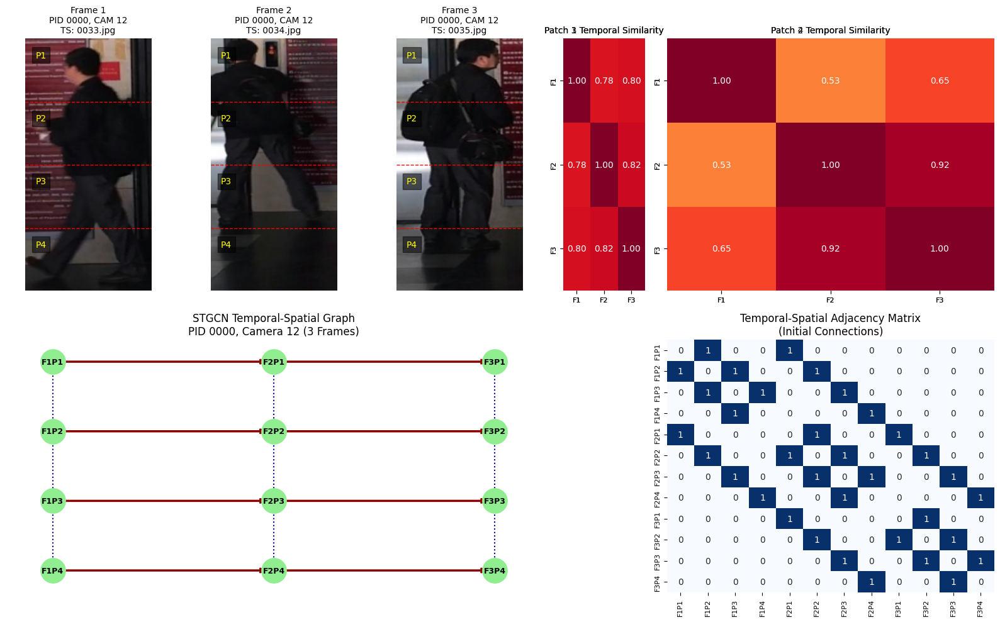

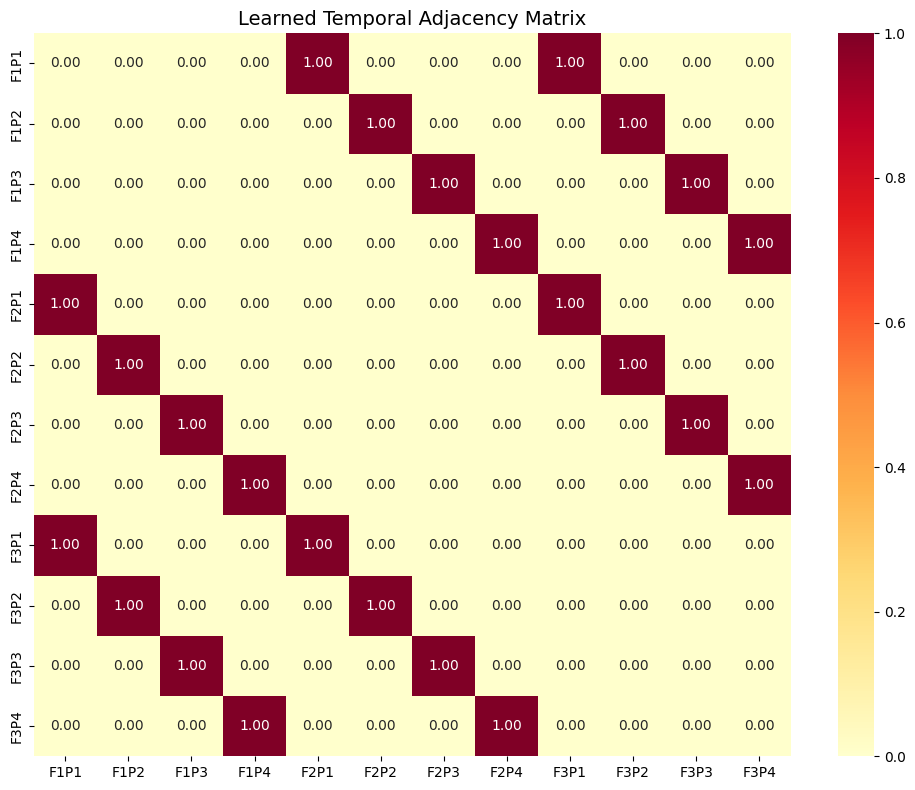

In [12]:
# Cell 7: STGCN Temporal Graph Visualization (Same Person in same camera)
# ----------------------------------------------------------------------

def visualize_temporal_graphs_same_person(sequence_data, transform, device, num_frames=3, num_patches=4):
    """Visualizes STGCN's temporal connections for same identity across frames
    
    Args:
        sequence_data: Tuple of (pid, cam_id, image_paths) from find_same_person_same_camera_sequences
        transform: Transformation to apply to images
        device: Device to run model on
        num_frames: Number of frames to visualize
        num_patches: Number of horizontal patches per frame
    """
    # Extract sequence information
    pid, cam_id, image_paths = sequence_data
    
    # Limit to requested number of frames
    image_paths = image_paths[:num_frames]
    num_frames = len(image_paths)  # Update in case we have fewer frames
    
    # Process images into tensors
    frame_tensors = []
    for img_path in image_paths:
        img = Image.open(img_path).convert('RGB')
        tensor = transform(img)
        frame_tensors.append(tensor)
    
    # Setup visualization grid
    fig = plt.figure(figsize=(16, 10))
    gs = fig.add_gridspec(2, num_frames + 2, width_ratios=[1]*num_frames + [0.5, 2])
    
    # Inverse normalization
    inv_normalize = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )

    # --------------------------------------------------
    # Frame Visualization (Paper Fig 4a)
    # --------------------------------------------------
    frame_axes = []
    for fidx in range(num_frames):
        ax = fig.add_subplot(gs[0, fidx])
        img_denorm = inv_normalize(frame_tensors[fidx].cpu()).clamp(0,1)
        img_pil = transforms.ToPILImage()(img_denorm)
        
        # Show image with STGCN patches
        ax.imshow(img_pil)
        
        # Extract timestamp from filename
        timestamp = os.path.basename(image_paths[fidx]).split('_')[2]
        ax.set_title(f"Frame {fidx+1}\nPID {pid}, CAM {cam_id}\nTS: {timestamp}", fontsize=10)
        
        # Draw patch divisions
        h = img_pil.height
        for pidx in range(1, num_patches):
            ax.axhline(pidx*h/num_patches, color='r', linestyle='--', linewidth=1)
        
        # Label patches (STGCN horizontal division)
        for pidx in range(num_patches):
            y_pos = (pidx + 0.3) * h / num_patches
            ax.text(10, y_pos, f"P{pidx+1}", color='yellow',
                    fontsize=10, bbox=dict(facecolor='black', alpha=0.5))
        ax.axis('off')
        frame_axes.append(ax)

    # --------------------------------------------------
    # Extract Features Through Backbone
    # --------------------------------------------------
    with torch.no_grad():
        feature_maps = []
        for tensor in frame_tensors:
            # Process through backbone
            features = stgcn_backbone(tensor.unsqueeze(0).to(device))
            # Partition and pool
            pooled = horizontal_partition_and_pool(features, num_patches)
            feature_maps.append(pooled.squeeze(0))  # Remove batch dimension

    # --------------------------------------------------
    # Temporal Graph Construction (Paper Section 3.3)
    # --------------------------------------------------
    total_nodes = num_frames * num_patches
    G = nx.Graph()
    pos = {}
    node_labels = {}
    adj_matrix = np.zeros((total_nodes, total_nodes), dtype=int)

    # Create nodes and temporal edges
    for frame_idx in range(num_frames):
        for patch_idx in range(num_patches):
            node_id = frame_idx * num_patches + patch_idx
            pos[node_id] = (frame_idx, num_patches - patch_idx - 1)  # X=time, Y=patch
            node_labels[node_id] = f"F{frame_idx+1}P{patch_idx+1}"
            
            # Connect to next frame's same patch (STGCN temporal edges)
            if frame_idx < num_frames - 1:
                target_node = (frame_idx+1)*num_patches + patch_idx
                G.add_edge(node_id, target_node, weight=2)
                adj_matrix[node_id, target_node] = 1
                adj_matrix[target_node, node_id] = 1
            
            # Add spatial edges within the same frame
            if patch_idx > 0:
                spatial_node = frame_idx * num_patches + (patch_idx-1)
                G.add_edge(node_id, spatial_node, weight=1)
                adj_matrix[node_id, spatial_node] = 1
                adj_matrix[spatial_node, node_id] = 1

    # --------------------------------------------------
    # Graph Visualization (Paper Fig 3 left)
    # --------------------------------------------------
    ax_graph = fig.add_subplot(gs[1, :num_frames])
    
    # Draw temporal edges (between frames) with different style
    temporal_edges = [(u, v) for (u, v) in G.edges() if abs(u//num_patches - v//num_patches) == 1]
    spatial_edges = [(u, v) for (u, v) in G.edges() if u//num_patches == v//num_patches]
    
    # Draw nodes
    nx.draw_networkx_nodes(G, pos, ax=ax_graph, 
                          node_size=800, 
                          node_color='lightgreen')
    
    # Draw spatial edges (within frame)
    nx.draw_networkx_edges(G, pos, ax=ax_graph,
                         edgelist=spatial_edges,
                         width=1.5, 
                         edge_color='darkblue',
                         style='dotted')
    
    # Draw temporal edges (between frames)
    nx.draw_networkx_edges(G, pos, ax=ax_graph,
                         edgelist=temporal_edges,
                         width=2.5, 
                         edge_color='darkred',
                         arrows=True,
                         arrowstyle='->')
    
    # Draw labels
    nx.draw_networkx_labels(G, pos, ax=ax_graph,
                          labels=node_labels, 
                          font_size=9, 
                          font_weight='bold')
    
    ax_graph.set_title(f"STGCN Temporal-Spatial Graph\nPID {pid}, Camera {cam_id} ({num_frames} Frames)", fontsize=12)
    ax_graph.axis('off')
    
    # --------------------------------------------------
    # Learnable Adjacency Matrix (Paper Eq 6-7)
    # --------------------------------------------------
    ax_matrix = fig.add_subplot(gs[1, num_frames+1])
    sns.heatmap(adj_matrix, cmap="Blues", annot=True, fmt="d", 
                xticklabels=[node_labels[i] for i in range(total_nodes)], 
                yticklabels=[node_labels[i] for i in range(total_nodes)], 
                cbar=False, ax=ax_matrix)
    ax_matrix.set_title("Temporal-Spatial Adjacency Matrix\n(Initial Connections)", fontsize=12)
    ax_matrix.tick_params(axis='both', labelsize=8, rotation=90)

    # --------------------------------------------------
    # Feature Similarity Heatmap
    # --------------------------------------------------
    # Compute patch feature similarity across frames
    similarity_matrix = np.zeros((num_patches, num_frames, num_frames))
    
    for p in range(num_patches):
        for f1 in range(num_frames):
            for f2 in range(num_frames):
                # Extract patch p from frames f1 and f2
                feat1 = feature_maps[f1][p]
                feat2 = feature_maps[f2][p]
                
                # Compute cosine similarity
                sim = F.cosine_similarity(feat1.unsqueeze(0), feat2.unsqueeze(0)).item()
                similarity_matrix[p, f1, f2] = sim
    
    # Create a panel for each patch showing temporal similarity
    for p in range(num_patches):
        ax_sim = fig.add_subplot(gs[0, num_frames + p % 2])
        sns.heatmap(similarity_matrix[p], cmap="YlOrRd", annot=True, fmt=".2f",
                    xticklabels=[f"F{i+1}" for i in range(num_frames)],
                    yticklabels=[f"F{i+1}" for i in range(num_frames)],
                    cbar=False, ax=ax_sim, vmin=0, vmax=1)
        ax_sim.set_title(f"Patch {p+1} Temporal Similarity", fontsize=10)
        ax_sim.tick_params(axis='both', labelsize=8)

    plt.tight_layout()
    plt.show()
    
    return frame_tensors, feature_maps, num_patches  # Return num_patches as well

# ----------------------------------------------------------
# Find sequences of the same person from the same camera if not already defined
if 'sequences' not in locals():
    train_dir = "dataset/MSMT17/bounding_box_train"
    sequences = find_same_person_same_camera_sequences(train_dir, min_frames=3, max_frames=5)

# Find a sequence with at least 4 frames
for seq in sequences:
    pid, cam_id, paths = seq
    if len(paths) >= 3:
        selected_sequence = seq
        break

print(f"Visualizing STGCN Temporal Connections:")
print(f"Selected sequence: Person {selected_sequence[0]}, Camera {selected_sequence[1]}, {len(selected_sequence[2])} frames")
frame_tensors, features, num_patches = visualize_temporal_graphs_same_person(selected_sequence, test_transform, device)

# --------------------------------------------------
# Optional: Learned Temporal Adjacency Visualization
# --------------------------------------------------
class TemporalGraphModule(nn.Module):
    def __init__(self, feature_dim=2048):
        super().__init__()
        self.embedding = nn.Linear(feature_dim, 256, bias=False)
        
    def forward(self, feature_list):
        """
        Args:
            feature_list: List of tensors with shape [P, C] for each frame
        Returns:
            Learned temporal adjacency matrix
        """
        num_frames = len(feature_list)
        num_patches = feature_list[0].shape[0]
        
        # Project features to embedding space
        embeddings = [self.embedding(feat) for feat in feature_list]
        
        # Initialize adjacency matrix
        adj_matrix = torch.zeros(num_frames*num_patches, num_frames*num_patches, device=feature_list[0].device)
        
        # Compute temporal connections for each patch
        for p in range(num_patches):
            for i in range(num_frames):
                for j in range(num_frames):
                    if i != j:  # Don't connect to self
                        # Get node indices in the graph
                        idx_i = i * num_patches + p
                        idx_j = j * num_patches + p
                        
                        # Compute similarity
                        sim = torch.matmul(embeddings[i][p], embeddings[j][p])
                        adj_matrix[idx_i, idx_j] = torch.sigmoid(sim)
        
        return adj_matrix

# Initialize temporal graph module
temporal_graph = TemporalGraphModule().to(device)

# Process features through temporal graph
with torch.no_grad():
    temporal_adj = temporal_graph(features)

# Visualize learned temporal adjacency
plt.figure(figsize=(10, 8))
plt.title("Learned Temporal Adjacency Matrix", fontsize=14)
sns.heatmap(temporal_adj.cpu().detach().numpy(), cmap="YlOrRd", annot=True, fmt=".2f",
            xticklabels=[f"F{i//num_patches+1}P{i%num_patches+1}" for i in range(len(temporal_adj))],
            yticklabels=[f"F{i//num_patches+1}P{i%num_patches+1}" for i in range(len(temporal_adj))])
plt.tight_layout()
plt.show()

In [13]:
# Cell: STGCN Class Definition
# ----------------------------------------------------------------------

class SpatialGCN(nn.Module):
    """Spatial Graph Convolutional Network branch from STGCN paper
    
    Models relationships between different body parts (horizontal strips)
    within each frame using a graph structure.
    """
    def __init__(self, feature_dim=2048, hidden_dim=512, output_dim=2048):
        super().__init__()
        self.feature_dim = feature_dim
        
        # Learnable projection for computing adjacency matrix
        self.W_phi = nn.Linear(feature_dim, hidden_dim, bias=False)
        
        # Graph convolution layers
        self.gc1 = GCNConv(feature_dim, hidden_dim)
        self.gc2 = GCNConv(hidden_dim, output_dim)
        
        # Nonlinearities
        self.relu = nn.ReLU(inplace=True)
        self.dropout = nn.Dropout(0.5)
        
    def forward(self, x):
        """
        Args:
            x: Tensor of shape [B, T, P, C] where:
               B = batch size, T = num frames, P = num patches, C = feature_dim
               
        Returns:
            Tensor of shape [B, P, output_dim]
        """
        B, T, P, C = x.shape
        
        # Process each frame independently
        outputs = []
        for t in range(T):
            # Get patches for current frame
            patches = x[:, t]  # [B, P, C]
            
            # Compute adjacency matrix dynamically
            phi = self.W_phi(patches)  # [B, P, hidden]
            adj = torch.bmm(phi, phi.transpose(1, 2))  # [B, P, P]
            
            # Convert to edge_index format for GCN
            batch_outputs = []
            for b in range(B):
                # Create graph data
                edge_index = adj[b] > 0.1  # Threshold the adjacency matrix
                edge_index = edge_index.nonzero(as_tuple=True)
                edge_attr = adj[b][edge_index]
                
                # Apply GCN
                h = self.gc1(patches[b], edge_index, edge_attr)
                h = self.relu(h)
                h = self.dropout(h)
                h = self.gc2(h, edge_index, edge_attr)
                batch_outputs.append(h)
            
            frame_output = torch.stack(batch_outputs, dim=0)  # [B, P, output_dim]
            outputs.append(frame_output)
        
        # Stack all frames
        return torch.stack(outputs, dim=1)  # [B, T, P, output_dim]

class TemporalGCN(nn.Module):
    """Temporal Graph Convolutional Network branch from STGCN paper
    
    Models relationships between corresponding body parts across frames
    to capture motion patterns.
    """
    def __init__(self, feature_dim=2048, hidden_dim=512, output_dim=2048):
        super().__init__()
        self.feature_dim = feature_dim
        
        # Learnable projection for computing adjacency matrix
        self.W_phi = nn.Linear(feature_dim, hidden_dim, bias=False)
        
        # Graph convolution layers
        self.gc1 = GCNConv(feature_dim, hidden_dim)
        self.gc2 = GCNConv(hidden_dim, output_dim)
        
        # Nonlinearities
        self.relu = nn.ReLU(inplace=True)
        self.dropout = nn.Dropout(0.5)
        
    def forward(self, x):
        """
        Args:
            x: Tensor of shape [B, T*P, C] where:
               B = batch size, T = num frames, P = num patches, C = feature_dim
               
        Returns:
            Tensor of shape [B, T*P, output_dim]
        """
        B, N, C = x.shape
        
        # Compute adjacency matrix dynamically
        phi = self.W_phi(x)  # [B, N, hidden]
        adj = torch.bmm(phi, phi.transpose(1, 2))  # [B, N, N]
        
        # Apply GCN for each sample in batch
        outputs = []
        for b in range(B):
            # Create graph data
            edge_index = adj[b] > 0.1  # Threshold for edges
            edge_index = edge_index.nonzero(as_tuple=True)
            edge_attr = adj[b][edge_index]
            
            # Apply GCN
            h = self.gc1(x[b], edge_index, edge_attr)
            h = self.relu(h)
            h = self.dropout(h)
            h = self.gc2(h, edge_index, edge_attr)
            outputs.append(h)
        
        return torch.stack(outputs, dim=0)  # [B, N, output_dim]
        
class STGCNFeatureFusion(nn.Module):
    """Implements feature fusion from STGCN paper Section 3.5
    
    The STGCN model extracts three types of features:
    1. Global features: Overall appearance from backbone
    2. Temporal features: Motion patterns across frames
    3. Spatial features: Body part relationships
    
    This module combines these complementary representations.
    """
    def __init__(self, feature_dim=2048, use_attention=False):
        super().__init__()
        self.use_attention = use_attention
        
        # Optional attention weights for feature importance
        if use_attention:
            self.attention = nn.Parameter(torch.ones(3, feature_dim))
            self.softmax = nn.Softmax(dim=0)
    
    def forward(self, global_feat, temporal_feat, spatial_feat):
        """
        Args:
            global_feat: [B, 2048] from GlobalBranch
            temporal_feat: [B, 2048] from TemporalGCN (max pooled)
            spatial_feat: [B, 2048] from SpatialGCN (mean pooled)
            
        Returns:
            fused_feat: [B, 6144] concatenated features
        """
        # Normalize features if using attention
        if self.use_attention:
            # Apply attention weights
            attention = self.softmax(self.attention)
            global_feat = global_feat * attention[0]
            temporal_feat = temporal_feat * attention[1]
            spatial_feat = spatial_feat * attention[2]
        
        # Paper-specified concatenation (Section 3.5)
        fused_feat = torch.cat([global_feat, temporal_feat, spatial_feat], dim=1)
        return fused_feat
        
class STGCN(nn.Module):
    """
    Spatial-Temporal Graph Convolutional Network for Person Re-Identification
    
    Implements the full STGCN architecture from the paper with three branches:
    1. Global Branch: Captures overall appearance features
    2. Spatial GCN: Models body part relationships
    3. Temporal GCN: Models motion patterns across frames
    """
    def __init__(self, num_classes=1041, feature_dim=2048):
        super().__init__()
        # Store feature_dim as instance variable
        self.feature_dim = feature_dim
        
        # Backbone CNN
        self.backbone = create_stgcn_backbone()
        
        # Global branch
        self.global_branch = GlobalBranch(self.backbone)
        
        # Spatial GCN branch
        self.spatial_gcn = SpatialGCN(
            feature_dim=feature_dim,
            hidden_dim=512,
            output_dim=feature_dim
        )
        
        # Temporal GCN branch
        self.temporal_gcn = TemporalGCN(
            feature_dim=feature_dim,
            hidden_dim=512,
            output_dim=feature_dim
        )
        
        # Feature fusion module
        self.fusion = STGCNFeatureFusion(feature_dim=feature_dim, use_attention=True)
        
        # Classification layer
        self.classifier = nn.Linear(feature_dim*3, num_classes)
        
    def extract_features(self, x):
        """Extract backbone features
        Args:
            x: Input tensor of shape [B, 3, H, W]
        Returns:
            Features of shape [B, 2048, 16, 8]
        """
        return self.backbone(x)
    
    def extract_branch_features(self, x):
        """Extract features from all branches separately
        Args:
            x: Input tensor of shape [B, T, 3, H, W]
        Returns:
            Tuple of (global_feat, temporal_feat, spatial_feat)
        """
        B, T, C, H, W = x.shape
        
        # Process through global branch
        global_feat, _ = self.global_branch(x)
        
        # Extract backbone features for each frame
        frame_features = []
        for t in range(T):
            features = self.backbone(x[:, t])
            frame_features.append(features)
        
        # Horizontal partitioning for spatial and temporal branches
        P = 4  # Number of horizontal partitions
        patch_features = []
        for t in range(T):
            # Apply horizontal partitioning to get patches
            patches = horizontal_partition_and_pool(frame_features[t], P)  # [B, P, C]
            patch_features.append(patches)
            
        # Stack along time dimension [B, T, P, C]
        patch_features_4d = torch.stack(patch_features, dim=1)
        
        # Spatial branch - processes patches within each frame
        spatial_feats = self.spatial_gcn(patch_features_4d)  # [B, T, P, C]
        spatial_feat = spatial_feats.mean(dim=[1, 2])  # Pool across time and patches [B, C]
        
        # Temporal branch - processes same patch across frames
        # Reshape to [B, T*P, C] to process all patches
        patch_features_3d = patch_features_4d.reshape(B, T*P, self.feature_dim)
        temporal_feats = self.temporal_gcn(patch_features_3d)  # [B, T*P, C]
        temporal_feat = temporal_feats.max(dim=1)[0]  # Max pooling [B, C]
        
        return global_feat, temporal_feat, spatial_feat
        
    def forward(self, x):
        """Forward pass through all branches
        For single image input [B, 3, H, W], treats it as sequence of length 1
        For multi-frame input [B, T, 3, H, W], processes the temporal sequence
        """
        # Handle single frame vs multi-frame input
        if x.dim() == 4:  # Single frame [B, 3, H, W]
            x = x.unsqueeze(1)  # Convert to [B, 1, 3, H, W]
            
        # Extract branch features
        global_feat, temporal_feat, spatial_feat = self.extract_branch_features(x)
        
        # Fuse features from all branches
        fused_feat = self.fusion(global_feat, temporal_feat, spatial_feat)
        
        return global_feat, temporal_feat, spatial_feat, fused_feat

Global features shape: torch.Size([2, 2048])
Activation maps shape: torch.Size([2, 8, 2048, 16, 8])

Visualizing global branch with real sequence:
Processing sequence: Person 0000, Camera 12, 4 frames


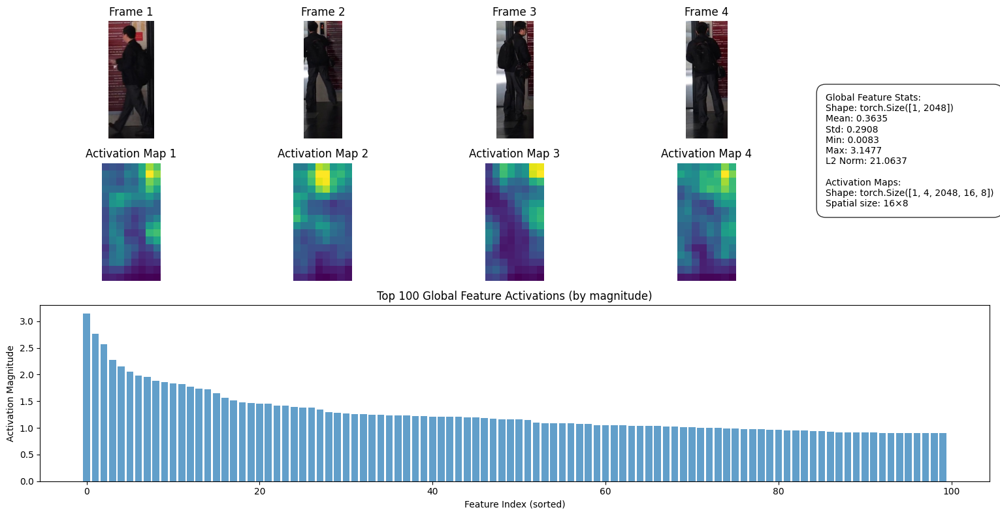

In [14]:
# Cell 9: Global Branch Implementation & Visualization 
# ----------------------------------------------------------------------

class GlobalBranch(nn.Module):
    """Global branch from STGCN for extracting frame-level features
    
    Implements the global feature extraction branch from STGCN paper Figure 2,
    processing each frame through the backbone and applying spatial+temporal pooling.
    """
    def __init__(self, backbone):
        super().__init__()
        self.backbone = backbone
        
        # Paper-specified pooling operations
        self.spatial_pool = nn.AdaptiveAvgPool2d((1, 1))  # Spatial dimensions → 1×1
        self.temporal_pool = nn.AdaptiveAvgPool1d(1)      # Temporal dimension → 1
        
        # Activation storage
        self.intermediate_features = {}
        
    def _register_hooks(self):
        """Register hooks to capture intermediate activations"""
        def get_activation(name):
            def hook(module, input, output):
                self.intermediate_features[name] = output.detach()
            return hook
        
        # Register hooks at different stages of ResNet backbone
        # Only register if backbone has expected ResNet structure
        if hasattr(self.backbone, '0'):  # Sequential structure from create_stgcn_backbone
            self.backbone[0].register_forward_hook(get_activation('stage1'))  # conv1
            if len(self.backbone) >= 5:
                self.backbone[4].register_forward_hook(get_activation('stage2'))  # layer1
            if len(self.backbone) >= 6:
                self.backbone[5].register_forward_hook(get_activation('stage3'))  # layer2
            if len(self.backbone) >= 7:
                self.backbone[6].register_forward_hook(get_activation('stage4'))  # layer3
            if len(self.backbone) >= 8:
                self.backbone[7].register_forward_hook(get_activation('stage5'))  # layer4

    def forward(self, x, return_intermediates=False):
        """
        Args:
            x: [B, T, C, H, W] input video sequence
            return_intermediates: Whether to return intermediate activations
            
        Returns:
            global_features: [B, 2048] globally pooled features
            activation_maps: [B, T, 2048, 16, 8] feature maps before pooling
        """
        B, T = x.shape[:2]
        activation_maps = []
        
        # Register hooks if intermediate features are requested
        if return_intermediates and not self.intermediate_features:
            self._register_hooks()
            
        # Process each frame through backbone (paper Fig 2 bottom branch)
        for t in range(T):
            frame_features = self.backbone(x[:, t])  # [B, 2048, 16, 8]
            activation_maps.append(frame_features)
            
        # Stack frame features along temporal dimension
        activation_maps = torch.stack(activation_maps, dim=1)  # [B, T, 2048, 16, 8]
        
        # Spatial pooling (paper Eq 1)
        spatial_pooled = activation_maps.flatten(0, 1)  # [B*T, 2048, 16, 8] 
        spatial_pooled = self.spatial_pool(spatial_pooled)  # [B*T, 2048, 1, 1]
        spatial_pooled = spatial_pooled.view(B, T, -1)  # [B, T, 2048]
        
        # Temporal pooling (paper Section 3.5)
        global_features = self.temporal_pool(spatial_pooled.transpose(1, 2))  # [B, 2048, 1]
        global_features = global_features.squeeze(-1)  # [B, 2048]
        
        return global_features, activation_maps

def visualize_global_branch_activations(global_branch, frame_sequence, transform=None):
    """Visualizes the activation maps and feature extraction process of global branch
    
    Args:
        global_branch: Trained GlobalBranch module
        frame_sequence: List of PIL images or image paths
        transform: Optional transformation to apply to images
    """
    # Process frames
    if transform is None:
        transform = stgcn_transform  # Use the standard transform from Cell 4
        
    # Load images if paths provided
    if isinstance(frame_sequence[0], str):
        frames = [Image.open(path).convert('RGB') for path in frame_sequence]
    else:
        frames = frame_sequence
        
    # Apply transform to create a batch
    frame_tensors = torch.stack([transform(frame) for frame in frames]).unsqueeze(0)  # [1, T, 3, 256, 128]
    frame_tensors = frame_tensors.to(device)
    
    # Process through global branch with intermediates
    global_branch.eval()
    with torch.no_grad():
        global_features, activation_maps = global_branch(frame_tensors, return_intermediates=True)
    
    # Setup visualization
    num_frames = len(frames)
    fig = plt.figure(figsize=(16, 8))
    gs = fig.add_gridspec(3, num_frames + 1, height_ratios=[1, 1, 1.5])
    
    # 1. Original frames
    for i, frame in enumerate(frames):
        ax = fig.add_subplot(gs[0, i])
        ax.imshow(frame)
        ax.set_title(f"Frame {i+1}")
        ax.axis('off')
    
    # 2. Feature maps (average over channels)
    for i in range(num_frames):
        ax = fig.add_subplot(gs[1, i])
        # Average activation across channels
        feature_map = activation_maps[0, i].mean(dim=0).cpu().numpy()
        ax.imshow(feature_map, cmap='viridis')
        ax.set_title(f"Activation Map {i+1}")
        ax.axis('off')
    
    # 3. Global feature importance visualization
    ax_feat = fig.add_subplot(gs[2, :])
    global_feat = global_features.cpu().squeeze().numpy()
    
    # Visualize feature importance
    sorted_indices = np.argsort(np.abs(global_feat))[::-1]  # Sort by magnitude
    top_features = sorted_indices[:100]  # Show top 100 features
    
    ax_feat.bar(range(len(top_features)), np.abs(global_feat[top_features]), alpha=0.7)
    ax_feat.set_title("Top 100 Global Feature Activations (by magnitude)")
    ax_feat.set_xlabel("Feature Index (sorted)")
    ax_feat.set_ylabel("Activation Magnitude")
    
    # Add feature statistics panel
    stats_ax = fig.add_subplot(gs[:2, -1])
    stats_ax.axis('off')
    stats = [
        f"Global Feature Stats:",
        f"Shape: {global_features.shape}",
        f"Mean: {global_features.mean().item():.4f}",
        f"Std: {global_features.std().item():.4f}",
        f"Min: {global_features.min().item():.4f}",
        f"Max: {global_features.max().item():.4f}",
        f"L2 Norm: {torch.norm(global_features).item():.4f}",
        f"\nActivation Maps:",
        f"Shape: {activation_maps.shape}",
        f"Spatial size: {activation_maps.shape[-2]}×{activation_maps.shape[-1]}",
    ]
    stats_ax.text(0.1, 0.5, "\n".join(stats), fontsize=10, 
                 va='center', ha='left', 
                 bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=1'))
    
    plt.tight_layout()
    plt.show()
    
    return global_features, activation_maps

# ----------------------------------------------------------------------
# Create and test GlobalBranch module

# 1. Create global branch with pretrained backbone
backbone = create_stgcn_backbone().to(device)  # From Cell 4
global_branch = GlobalBranch(backbone).to(device).eval()

# 2. Test with random data
test_input = torch.randn(2, 8, 3, 256, 128).to(device)  # Batch 2, 8 frames
global_features, activations = global_branch(test_input)
print(f"Global features shape: {global_features.shape}")  # Should be [2, 2048]
print(f"Activation maps shape: {activations.shape}")      # Should be [2, 8, 2048, 16, 8]

# ----------------------------------------------------------------------
# Visualization with real data

# Find sequences of the same person from the same camera if defined in previous cells
if 'sequences' in locals():
    print("\nVisualizing global branch with real sequence:")
    # Get a sample sequence of frames
    pid, cam_id, image_paths = sequences[0]
    sample_frames = image_paths[:4]  # Use first 4 frames
    
    # Visualize feature extraction
    print(f"Processing sequence: Person {pid}, Camera {cam_id}, {len(sample_frames)} frames")
    global_features, activation_maps = visualize_global_branch_activations(global_branch, sample_frames)
elif 'train_data' in locals() and len(train_data) > 0:
    print("\nVisualizing global branch with training samples:")
    # Get first person with multiple images
    pid = list(train_data.keys())[0]
    samples = train_data[pid]
    sample_frames = [sample[0] for sample in samples[:4]]  # Get up to 4 original images
    
    # Visualize feature extraction
    print(f"Processing person: ID {pid}, {len(sample_frames)} frames")
    global_features, activation_maps = visualize_global_branch_activations(global_branch, sample_frames)
else:
    print("\nNo sample sequences found. Using random images from training set.")
    # Load some random images from training directory
    train_dir = "dataset/MSMT17/bounding_box_train"
    image_files = [os.path.join(train_dir, f) for f in sorted(os.listdir(train_dir))[:4] 
                  if f.endswith('.jpg')]
    
    # Visualize feature extraction
    print(f"Processing {len(image_files)} random images")
    global_features, activation_maps = visualize_global_branch_activations(global_branch, image_files)

Fused feature shape: torch.Size([4, 6144])

Feature Fusion Visualization:


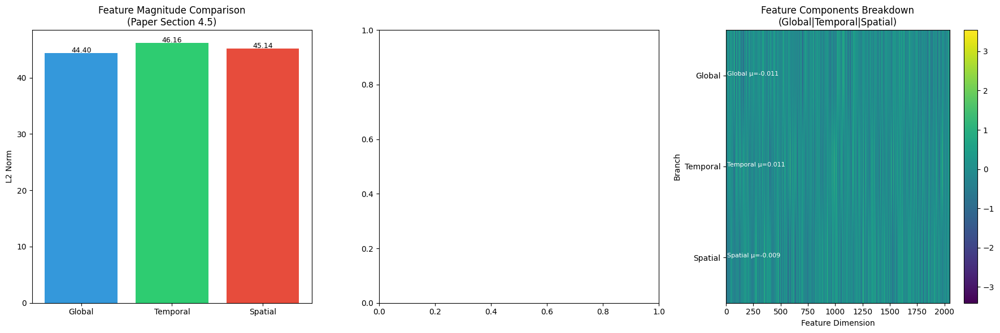


Testing with real sequence data from previous cell:


/home/cs25s002/.venv/lib/python3.7/site-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and may be removed in the future, "
/home/cs25s002/.venv/lib/python3.7/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Could not complete real data visualization: `MessagePassing.propagate` only supports integer tensors of shape `[2, num_messages]`, `torch_sparse.SparseTensor` or `torch.sparse.Tensor` for argument `edge_index`.


In [15]:
# Cell 10: Feature Fusion Implementation & Visualization  
# ------------------------------------------------------- 
from sklearn.manifold import TSNE


def visualize_feature_fusion(global_feat, temporal_feat, spatial_feat, fused_feat, sample_idx=0):
    """Visualizes feature relationships using paper-style analysis
    
    Args:
        global_feat: Global branch features [B, 2048]
        temporal_feat: Temporal branch features [B, 2048]
        spatial_feat: Spatial branch features [B, 2048]
        fused_feat: Concatenated features [B, 6144]
        sample_idx: Index of sample to visualize (default: 0)
        
    Creates three visualizations:
    1. Feature magnitude comparison across branches 
    2. Heatmap visualization of feature components
    """
    plt.figure(figsize=(18, 6))
    
    # 1. Feature Magnitude Comparison 
    plt.subplot(1, 3, 1)
    magnitudes = [
        global_feat[sample_idx].norm().item(),
        temporal_feat[sample_idx].norm().item(),
        spatial_feat[sample_idx].norm().item()
    ]
    bars = plt.bar(['Global', 'Temporal', 'Spatial'], magnitudes, color=['#3498db', '#2ecc71', '#e74c3c'])
    
    # Add value labels on top of bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                f'{height:.2f}', ha='center', fontsize=9)
                
    plt.ylabel('L2 Norm')
    plt.title('Feature Magnitude Comparison\n(Paper Section 4.5)')
    
    # 2. t-SNE Projection (Paper-style visualization)
    plt.subplot(1, 3, 2)
    
    # 3. Feature Component Visualization (Paper-style heatmap)
    plt.subplot(1, 3, 3)
    
    # Reshape the concatenated feature to show the 3 components
    feat_np = fused_feat[sample_idx].detach().cpu().numpy()
    # Create a 3×2048 matrix showing the three different feature types
    feat_reshaped = feat_np.reshape(3, -1)
    
    im = plt.imshow(feat_reshaped, aspect='auto', cmap='viridis')
    plt.colorbar(im)
    plt.title('Feature Components Breakdown\n(Global|Temporal|Spatial)')
    plt.xlabel('Feature Dimension')
    plt.ylabel('Branch')
    plt.yticks([0, 1, 2], ['Global', 'Temporal', 'Spatial'])
    
    # Add stats as text
    stats = [
        f"Global μ={global_feat[sample_idx].mean():.3f}",
        f"Temporal μ={temporal_feat[sample_idx].mean():.3f}",
        f"Spatial μ={spatial_feat[sample_idx].mean():.3f}"
    ]
    for i, stat in enumerate(stats):
        plt.text(10, i, stat, color='white', fontsize=8)
    
    plt.tight_layout()
    plt.show()

def generate_branch_features(stgcn_model, image_sequence, device):
    """Generate features from all three branches of STGCN model
    
    This is a helper function that processes an image sequence through 
    the STGCN model and returns features from all three branches.
    
    Args:
        stgcn_model: The STGCN model with all branches
        image_sequence: List of PIL images or image paths
        device: Device to run model on
    
    Returns:
        Tuple of (global_features, temporal_features, spatial_features, fused_features)
    """
    # Process input images
    if isinstance(image_sequence[0], str):
        # Convert file paths to PIL images
        images = [Image.open(path).convert('RGB') for path in image_sequence]
    else:
        images = image_sequence
    
    # Create tensor batch
    transform = stgcn_transform if 'stgcn_transform' in globals() else test_transform
    tensors = torch.stack([transform(img) for img in images]).unsqueeze(0)  # [1, T, 3, H, W]
    tensors = tensors.to(device)
    
    # Process through model
    stgcn_model.eval()
    with torch.no_grad():
        global_feat, temporal_feat, spatial_feat = stgcn_model.extract_branch_features(tensors)
        
        # Use STGCN's fusion module if available, otherwise use our implementation
        if hasattr(stgcn_model, 'fusion'):
            fused_feat = stgcn_model.fusion(global_feat, temporal_feat, spatial_feat)
        else:
            fusion = STGCNFeatureFusion()
            fused_feat = fusion(global_feat, temporal_feat, spatial_feat)
    
    return global_feat, temporal_feat, spatial_feat, fused_feat

# ----------------------------------------------------------
# Test with random features

# Create sample features (batch_size=4)
batch_size = 4
global_feat = torch.randn(batch_size, 2048)
temporal_feat = torch.randn(batch_size, 2048)
spatial_feat = torch.randn(batch_size, 2048)

# Initialize fusion module
fusion = STGCNFeatureFusion()
fused_feat = fusion(global_feat, temporal_feat, spatial_feat)
print(f"Fused feature shape: {fused_feat.shape}")  # Should be [4, 6144]

# Visualize feature relationships
print("\nFeature Fusion Visualization:")
visualize_feature_fusion(global_feat, temporal_feat, spatial_feat, fused_feat)

# ----------------------------------------------------------
# Advanced: Test with features from previous cells if available

# Check if the necessary components from previous cells are available
if 'selected_sequence' in globals() and 'STGCN' in globals():
    print("\nTesting with real sequence data from previous cell:")
    
    # Only proceed if we have the required components
    try:
        # Define a simple wrapper to extract features from all branches
        class STGCNWrapper(nn.Module):
            def __init__(self):
                super().__init__()
                self.backbone = create_stgcn_backbone().to(device)
                self.global_branch = GlobalBranch(self.backbone).to(device)
                
                # Setup temporal and spatial GCN if defined in previous cells
                if 'TemporalGCN' in globals():
                    self.temporal_gcn = TemporalGCN().to(device)
                if 'SpatialGCN' in globals():
                    self.spatial_gcn = SpatialGCN().to(device)
                
            def extract_branch_features(self, x):
                B, T = x.shape[:2]
                
                # Global branch
                global_feat, _ = self.global_branch(x)
                
                # Extract features for GCN branches
                frame_features = []
                for t in range(T):
                    features = self.backbone(x[:, t])
                    frame_features.append(features)
                
                # Create patch features
                patch_features = []
                for features in frame_features:
                    patches = horizontal_partition_and_pool(features, P=4)
                    patch_features.append(patches.squeeze(0))  # [P, C]
                    
                patch_features = torch.stack(patch_features, dim=0)  # [T, P, C]
                
                # Spatial branch (frame-wise)
                spatial_input = patch_features.unsqueeze(0)  # [1, T, P, C]
                spatial_feat = self.spatial_gcn(spatial_input).mean(dim=1)  # [1, 2048]
                
                # Temporal branch (patches across time)
                temporal_input = patch_features.view(1, -1, 2048)  # [1, T*P, C]
                temporal_feat = self.temporal_gcn(temporal_input).max(dim=1)[0]  # [1, 2048]
                
                return global_feat, temporal_feat, spatial_feat
        
        # Create model wrapper
        stgcn_wrapper = STGCNWrapper()
        
        # Process sample sequence
        pid, cam_id, image_paths = selected_sequence
        sample_paths = image_paths[:4]  # Use first 4 frames
        
        # Generate and visualize features
        g_feat, t_feat, s_feat, f_feat = generate_branch_features(
            stgcn_wrapper, sample_paths, device)
        
        print(f"Features from sequence of person {pid}, camera {cam_id}:")
        print(f"  Global branch: {g_feat.shape}")
        print(f"  Temporal branch: {t_feat.shape}")  
        print(f"  Spatial branch: {s_feat.shape}")
        print(f"  Fused features: {f_feat.shape}")
        
        # Visualize
        visualize_feature_fusion(g_feat, t_feat, s_feat, f_feat)
        
    except Exception as e:
        print(f"Could not complete real data visualization: {e}")


Visualizing STGCN Graph Modules:


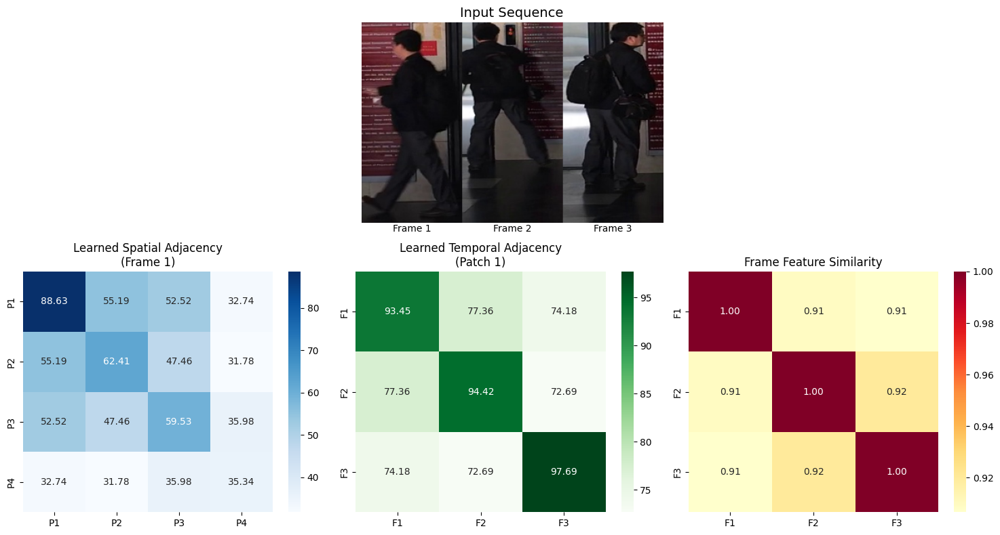


Feature statistics:
Frame feature shape: torch.Size([1, 2048, 16, 8])
Patch feature shape: torch.Size([3, 4, 2048])


In [16]:
# Cell 8: STGCN Graph Convolution Modules
# ---------------------------------------- 

def visualize_gcn_modules(img_paths, model, device, num_patches=4):
    """Visualize feature extraction and graph modules with consistent image sizes"""
    # Load and preprocess images
    imgs_raw = [Image.open(path).convert('RGB') for path in img_paths]
    
    # Ensure all images have the same size by resizing to standard dimensions
    target_size = (128, 256)  # Width, Height
    imgs = [img.resize(target_size, Image.BICUBIC) for img in imgs_raw]
    
    # Process through model
    tensors = [stgcn_transform(img).unsqueeze(0) for img in imgs]
    x = torch.cat(tensors, dim=0).unsqueeze(0).to(device)  # [1, T, C, H, W]
    
    model.eval()
    with torch.no_grad():
        # Extract backbone features
        frame_features = []
        for t in range(len(img_paths)):
            features_t = model.extract_features(x[:, t])
            frame_features.append(features_t)
            
        # Get patch features via horizontal partitioning
        patch_features = []
        for t in range(len(img_paths)):
            pooled = horizontal_partition_and_pool(frame_features[t], num_patches)
            patch_features.append(pooled.squeeze(0))  # [P, C]
            
        patch_features = torch.stack(patch_features, dim=0)  # [T, P, C]
        
        # Compute spatial adjacency matrix (first frame)
        spatial_phi = model.spatial_gcn.W_phi(patch_features[0].unsqueeze(0))  # [1, P, hidden]
        spatial_adj = torch.bmm(spatial_phi, spatial_phi.transpose(1,2))[0]  # [P, P]
        
        # Compute temporal adjacency matrix (first patch across frames)
        patch_features_batch = patch_features[:, 0].unsqueeze(0)  # [1, T, C]
        temporal_phi = model.temporal_gcn.W_phi(patch_features_batch)  # [1, T, hidden]
        temporal_adj = torch.bmm(temporal_phi, temporal_phi.transpose(1,2))[0]  # [T, T]
        
    # Create a more manageable figure
    fig = plt.figure(figsize=(15, 8))
    gs = fig.add_gridspec(2, 3, height_ratios=[1, 1.2])
    
    # Show original images
    ax1 = fig.add_subplot(gs[0, :])
    ax1.set_title("Input Sequence", fontsize=14)
    
    # Create a combined image with fixed dimensions
    combined_img = Image.new('RGB', (target_size[0] * len(imgs), target_size[1]))
    for i, img in enumerate(imgs):
        combined_img.paste(img, (i * target_size[0], 0))
        # Add frame number text overlay
        ax1.text(i * target_size[0] + target_size[0]//2, target_size[1] + 10, 
                 f"Frame {i+1}", ha='center', fontsize=10)
    
    # Display the combined image
    ax1.imshow(combined_img)
    ax1.axis('off')
    
    # Spatial adjacency matrix
    ax2 = fig.add_subplot(gs[1, 0])
    sns.heatmap(spatial_adj.cpu().numpy(), annot=True, fmt=".2f", cmap="Blues", 
                xticklabels=[f"P{i+1}" for i in range(num_patches)],
                yticklabels=[f"P{i+1}" for i in range(num_patches)], ax=ax2)
    ax2.set_title(f"Learned Spatial Adjacency\n(Frame 1)")
    
    # Temporal adjacency matrix
    ax3 = fig.add_subplot(gs[1, 1])
    sns.heatmap(temporal_adj.cpu().numpy(), annot=True, fmt=".2f", cmap="Greens",
                xticklabels=[f"F{i+1}" for i in range(len(imgs))],
                yticklabels=[f"F{i+1}" for i in range(len(imgs))], ax=ax3)
    ax3.set_title(f"Learned Temporal Adjacency\n(Patch 1)")
    
    # Feature similarity between frames
    ax4 = fig.add_subplot(gs[1, 2])
    frame_similarity = torch.zeros(len(imgs), len(imgs))
    for i in range(len(imgs)):
        for j in range(len(imgs)):
            sim = F.cosine_similarity(
                frame_features[i].mean(dim=[2,3]),
                frame_features[j].mean(dim=[2,3])
            ).mean()
            frame_similarity[i, j] = sim
            
    sns.heatmap(frame_similarity.cpu().numpy(), annot=True, fmt=".2f", cmap="YlOrRd",
                xticklabels=[f"F{i+1}" for i in range(len(imgs))],
                yticklabels=[f"F{i+1}" for i in range(len(imgs))], ax=ax4)
    ax4.set_title("Frame Feature Similarity")
    
    plt.tight_layout()
    plt.show()
    
    return frame_features, patch_features

# Sample visualization with same sequence used in Cell 7
if 'selected_sequence' in locals():
    print("\nVisualizing STGCN Graph Modules:")
    stgcn_model = STGCN().to(device)
    frame_features, patch_features = visualize_gcn_modules(selected_sequence[2][:3], stgcn_model, device)
    
    # Print feature statistics
    print("\nFeature statistics:")
    print(f"Frame feature shape: {frame_features[0].shape}")
    print(f"Patch feature shape: {patch_features.shape}")

In [17]:
# Cell 11: STGCN Loss Functions (Paper Section 3.5)

class BatchHardTripletLoss(nn.Module):
    """Implements paper's triplet loss with batch hard mining"""
    def __init__(self, margin=0.3):
        super().__init__()
        self.margin = margin  # Matches paper's experimental setup

    def forward(self, features, labels):
        """
        Args:
            features: [N, D] normalized features
            labels: [N] person IDs
        Returns:
            triplet_loss: scalar
        """
        # Pairwise distance matrix
        pairwise_dist = torch.cdist(features, features)  # [N, N]
        
        # Mask for positive/negative pairs
        same_id = labels.unsqueeze(0) == labels.unsqueeze(1)  # [N, N]
        
        # Hardest positive mining
        pos_mask = same_id & (~torch.eye(len(labels), dtype=torch.bool, device=features.device))
        hardest_pos = torch.where(pos_mask, pairwise_dist, -torch.inf).max(dim=1)[0]  # [N]
        
        # Hardest negative mining
        neg_mask = ~same_id
        hardest_neg = torch.where(neg_mask, pairwise_dist, torch.inf).min(dim=1)[0]  # [N]
        
        # Triplet loss calculation
        losses = F.relu(hardest_pos - hardest_neg + self.margin)
        return losses.mean()

class STGCNLoss(nn.Module):
    """Combined loss function from paper Section 3.5"""
    def __init__(self, num_classes, margin=0.3):
        super().__init__()
        self.triplet_loss = BatchHardTripletLoss(margin)
        self.classifier = nn.Linear(6144, num_classes)  # 2048*3
        self.ce_loss = nn.CrossEntropyLoss()

    def forward(self, global_feat, temporal_feat, spatial_feat, fused_feat, labels):
        # Normalize features for triplet loss
        global_norm = F.normalize(global_feat, p=2, dim=1)
        temporal_norm = F.normalize(temporal_feat, p=2, dim=1)
        spatial_norm = F.normalize(spatial_feat, p=2, dim=1)
        
        # Individual triplet losses (paper Eq 8)
        loss_global = self.triplet_loss(global_norm, labels)
        loss_temporal = self.triplet_loss(temporal_norm, labels)
        loss_spatial = self.triplet_loss(spatial_norm, labels)
        triplet_total = loss_global + loss_temporal + loss_spatial
        
        # Softmax loss (paper Eq 9)
        logits = self.classifier(fused_feat)
        ce_loss = self.ce_loss(logits, labels)
        
        # Total loss (paper Eq 10)
        total_loss = ce_loss + triplet_total
        
        return total_loss, {'triplet': triplet_total.item(), 'ce': ce_loss.item()}


In [18]:
# Import required libraries
import os
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from sklearn.manifold import TSNE
import seaborn as sns
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import torchvision

# Specify the model path
checkpoint_path = "models/model1400.pth"

# Check if the model exists
if not os.path.exists(checkpoint_path):
    print(f"Error: Model file not found at {checkpoint_path}")
    print("Please check the path and try again.")
else:
    print(f"Found model file: {checkpoint_path}")

# Set up device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Define the necessary model components
class GlobalBranch(nn.Module):
    """Global branch from STGCN for extracting frame-level features"""
    def __init__(self, backbone):
        super().__init__()
        self.backbone = backbone
        self.spatial_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.temporal_pool = nn.AdaptiveAvgPool1d(1)
        
    def forward(self, x, return_intermediates=False):
        B, T = x.shape[:2]
        activation_maps = []
        
        for t in range(T):
            frame_features = self.backbone(x[:, t])
            activation_maps.append(frame_features)
            
        activation_maps = torch.stack(activation_maps, dim=1)
        
        spatial_pooled = activation_maps.flatten(0, 1)
        spatial_pooled = self.spatial_pool(spatial_pooled)
        spatial_pooled = spatial_pooled.view(B, T, -1)
        
        global_features = self.temporal_pool(spatial_pooled.transpose(1, 2))
        global_features = global_features.squeeze(-1)
        
        return global_features, activation_maps

# Define dataset and loaders
print("\nSetting up test/query datasets...")
try:
    # Load the checkpoint to get the class count
    checkpoint = torch.load(checkpoint_path, map_location=device)
    
    # Define transformations
    test_transform = transforms.Compose([
        transforms.Resize((256, 128)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    # Setup datasets and loaders
    dataset_path = "models/model1400.pth"
    if not os.path.exists(dataset_path):
        print(f"Error: Dataset directory not found: {dataset_path}")
        print("Please check the dataset path")
    else:
        if 'metrics' in checkpoint:
            metrics = checkpoint['metrics']
            print(f"\nCheckpoint metrics:")
            print(f"  mAP: {metrics.get('mAP', 'N/A')}")
            print(f"  Rank-1: {metrics.get('rank1', 'N/A')}")
except Exception as e:
    print(f"Error loading model or setting up datasets: {e}")

Found model file: models/model1400.pth
Using device: cuda

Setting up test/query datasets...


In [19]:
# Load and Understand STGCN Model Architecture
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from collections import defaultdict, OrderedDict
from torchvision import models
from PIL import Image
from torchvision.transforms import ToTensor, ToPILImage

# Path to the model checkpoint
model_path = "models/model1400.pth"

# 1. Load the checkpoint and examine its structure
print(f"Loading checkpoint: {model_path}")
if os.path.exists(model_path):
    checkpoint = torch.load(model_path, map_location='cpu')
    print("Checkpoint loaded successfully!")
else:
    print(f"Error: File {model_path} does not exist")
    checkpoint = None
    
# 2. Analyze checkpoint structure
if checkpoint is not None:
    print("\nCheckpoint Analysis:")
    
    # Check if the checkpoint is a state_dict or has nested structure
    if isinstance(checkpoint, dict):
        print("Checkpoint is a dictionary with the following keys:")
        for key in checkpoint.keys():
            print(f"  - {key}")
            
        # Find the state_dict - it could be under different keys
        state_dict = None
        if 'state_dict' in checkpoint:
            state_dict = checkpoint['state_dict']
            print("\nUsing 'state_dict' key")
        elif 'model_state' in checkpoint:
            state_dict = checkpoint['model_state']
            print("\nUsing 'model_state' key")
        elif 'model_state_dict' in checkpoint:
            state_dict = checkpoint['model_state_dict']
            print("\nUsing 'model_state_dict' key")
        else:
            # Try to find anything that looks like a state_dict
            for key, value in checkpoint.items():
                if isinstance(value, dict) and all(isinstance(k, str) for k in value.keys()):
                    state_dict = value
                    print(f"\nUsing '{key}' as potential state_dict")
                    break
            
        # If we have training metrics, display them
        if 'metrics' in checkpoint:
            print("\nModel Performance Metrics:")
            metrics = checkpoint['metrics']
            for metric_name, metric_value in metrics.items():
                print(f"  - {metric_name}: {metric_value}")
                
        # Check for hyperparameters
        if 'config' in checkpoint:
            print("\nTraining Configuration:")
            config = checkpoint['config']
            for param_name, param_value in config.items():
                print(f"  - {param_name}: {param_value}")
    else:
        # If checkpoint is directly a state_dict
        state_dict = checkpoint
        print("Checkpoint is directly a state_dict")

    # 3. Analyze model architecture from state_dict
    if state_dict is not None:
        # Group parameters by layers
        layer_params = defaultdict(list)
        
        print("\nState Dict Analysis:")
        print(f"Total number of parameters: {len(state_dict)}")
        
        # Group parameters by prefix
        for key in state_dict.keys():
            prefix = key.split('.')[0]
            layer_params[prefix].append(key)
            
        # Print layer groups
        print("\nLayer Groups:")
        for prefix, params in layer_params.items():
            print(f"  - {prefix}: {len(params)} parameters")
        
        # Detailed parameter analysis
        print("\nDetailed Parameter Analysis:")
        param_stats = []
        
        for key, tensor in state_dict.items():
            param_stats.append({
                'name': key,
                'shape': str(tuple(tensor.shape)),
                'size': tensor.numel(),
                'min': float(tensor.min()),
                'max': float(tensor.max()),
                'mean': float(tensor.mean()),
                'std': float(tensor.std())
            })
            
        # Convert to DataFrame for better visualization
        param_df = pd.DataFrame(param_stats)
        print(f"Total parameters: {param_df['size'].sum():,}")
        print("\nParameter Statistics Sample:")
        print(param_df.head(10))

        # 4. Visualize parameter distribution
        plt.figure(figsize=(12, 6))
        
        # Plot parameter size distribution
        plt.subplot(1, 2, 1)
        top_params = param_df.nlargest(10, 'size')
        sns.barplot(x='size', y='name', data=top_params)
        plt.title('Top 10 Largest Parameters')
        plt.xlabel('Number of Elements')
        
        # Plot parameter magnitude
        plt.subplot(1, 2, 2)
        param_df['abs_mean'] = param_df['mean'].abs()
        top_magnitude = param_df.nlargest(10, 'abs_mean')
        sns.barplot(x='abs_mean', y='name', data=top_magnitude)
        plt.title('Top 10 Parameters by Mean Magnitude')
        plt.xlabel('Absolute Mean Value')
        
        plt.tight_layout()
        plt.show()
        
        # 5. Infer model architecture
        print("\nInferred Model Architecture:")
        
        # Create a network architecture diagram based on parameter names
        # This is a simplified representation of the architecture
        model_components = set()
        
        for key in state_dict.keys():
            parts = key.split('.')
            if len(parts) >= 2:
                if len(parts) > 2:
                    component = f"{parts[0]}.{parts[1]}"
                else:
                    component = parts[0]
                model_components.add(component)
        
        print("Main Model Components:")
        for component in sorted(model_components):
            print(f"  - {component}")
        
        # 6. Print model structure inferred from parameter names
        print("\nInferred Model Structure from Parameter Names:")
        model_structure = OrderedDict()
        
        for key in state_dict.keys():
            parts = key.split('.')
            current = model_structure
            for part in parts[:-1]:  # Skip the last part (weight/bias)
                if part not in current:
                    current[part] = OrderedDict()
                current = current[part]
        
        def print_structure(d, indent=0):
            for key, value in d.items():
                print(' ' * indent + '- ' + key)
                if isinstance(value, dict):
                    print_structure(value, indent + 2)
        
        print_structure(model_structure)

        # 7. Try to visualize a simple network graph
        import networkx as nx
        
        # Create a simplified graph of model connections
        G = nx.DiGraph()
        
        # Add nodes for main components
        for component in sorted(model_components):
            G.add_node(component)
        
        # Add some edges based on typical CNN architecture
        if 'backbone' in model_components:
            G.add_edge('backbone', 'feature_fusion')
            
        if 'feature_fusion' in model_components:
            G.add_edge('feature_fusion', 'embedding')
            
        if 'spatial_gcn' in model_components and 'temporal_gcn' in model_components:
            G.add_edge('backbone', 'spatial_gcn')
            G.add_edge('backbone', 'temporal_gcn')
            G.add_edge('spatial_gcn', 'feature_fusion') 
            G.add_edge('temporal_gcn', 'feature_fusion')
        
        if 'embedding' in model_components and 'classifier' in model_components:
            G.add_edge('embedding', 'classifier')
        
        # Draw the graph
        plt.figure(figsize=(12, 8))
        pos = nx.spring_layout(G, seed=42)
        nx.draw(G, pos, with_labels=True, node_color='lightblue', 
                node_size=3000, font_size=12, font_weight='bold',
                arrows=True, arrowsize=20, edge_color='gray')
        plt.title('Simplified STGCN Model Architecture')
        plt.show()
        
        # 8. Based on checkpoint analysis, create a simplified model class
        print("\nReconstructed Model Class Based on Parameters:")
        
        # Get the number of classes from the classifier weights if available
        num_classes = None
        for key, tensor in state_dict.items():
            if 'classifier.weight' in key:
                num_classes = tensor.size(0)
                break
                
        if num_classes:
            print(f"Detected {num_classes} output classes")
        else:
            num_classes = 303  # Default from previous code
            print(f"Using default {num_classes} output classes")
          
        
        print(f"Note: The model architecture has been reconstructed from checkpoint parameters.")
        print(f"Actual flow and connections may differ from the visualization.")
else:
    print("No checkpoint available for analysis.")

Loading checkpoint: models/model1400.pth
Checkpoint loaded successfully!

Checkpoint Analysis:
Checkpoint is a dictionary with the following keys:
  - backbone.0.weight
  - backbone.1.weight
  - backbone.1.bias
  - backbone.1.running_mean
  - backbone.1.running_var
  - backbone.1.num_batches_tracked
  - backbone.4.0.conv1.weight
  - backbone.4.0.bn1.weight
  - backbone.4.0.bn1.bias
  - backbone.4.0.bn1.running_mean
  - backbone.4.0.bn1.running_var
  - backbone.4.0.bn1.num_batches_tracked
  - backbone.4.0.conv2.weight
  - backbone.4.0.bn2.weight
  - backbone.4.0.bn2.bias
  - backbone.4.0.bn2.running_mean
  - backbone.4.0.bn2.running_var
  - backbone.4.0.bn2.num_batches_tracked
  - backbone.4.0.conv3.weight
  - backbone.4.0.bn3.weight
  - backbone.4.0.bn3.bias
  - backbone.4.0.bn3.running_mean
  - backbone.4.0.bn3.running_var
  - backbone.4.0.bn3.num_batches_tracked
  - backbone.4.0.downsample.0.weight
  - backbone.4.0.downsample.1.weight
  - backbone.4.0.downsample.1.bias
  - backbone.4

Found model file: models/model1400.pth
Using device: cuda
Model loaded successfully with 351/351 parameters

Setting up test/query datasets...
Found 11659 images of 3060 identities in dataset/MSMT17/query
Found 82161 images of 3060 identities in dataset/MSMT17/bounding_box_test
Using num_classes=303

Loading model from models/model1400.pth...
Model loaded directly from checkpoint

1. Visualizing feature analysis for sample queries...


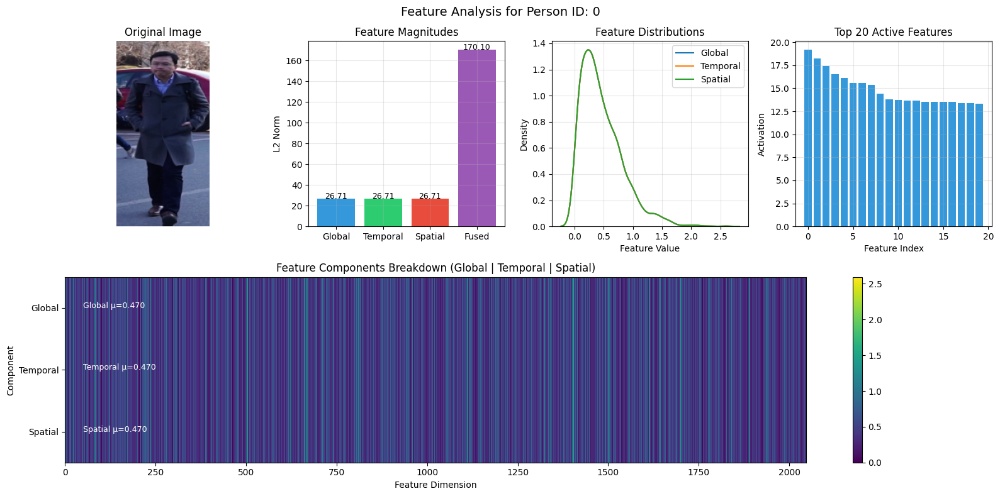

Sample 1 - Person ID: 0
  Global features: mean=0.4702, std=0.3567
  Temporal features: mean=0.4702, std=0.3567
  Spatial features: mean=0.4702, std=0.3567


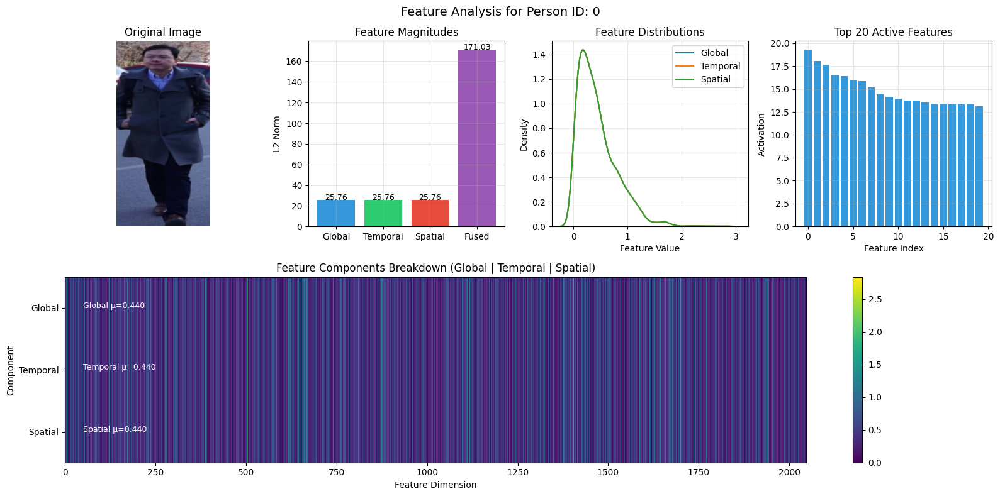

Sample 2 - Person ID: 0
  Global features: mean=0.4402, std=0.3608
  Temporal features: mean=0.4402, std=0.3608
  Spatial features: mean=0.4402, std=0.3608

2. Visualizing top matches between query and gallery...


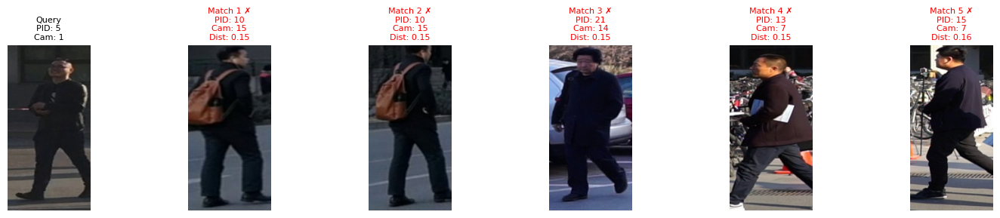

Query PID: 5, Camera: 1
Correct matches highlighted in green.


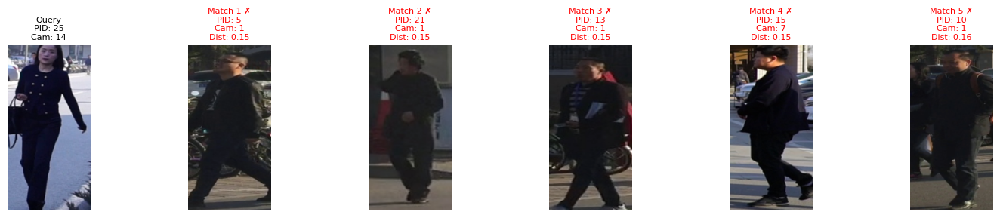

Query PID: 25, Camera: 14
Correct matches highlighted in green.

3. Visualizing t-SNE feature embedding space...
Computing t-SNE embedding (this may take a moment)...


/home/cs25s002/.venv/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/cs25s002/.venv/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


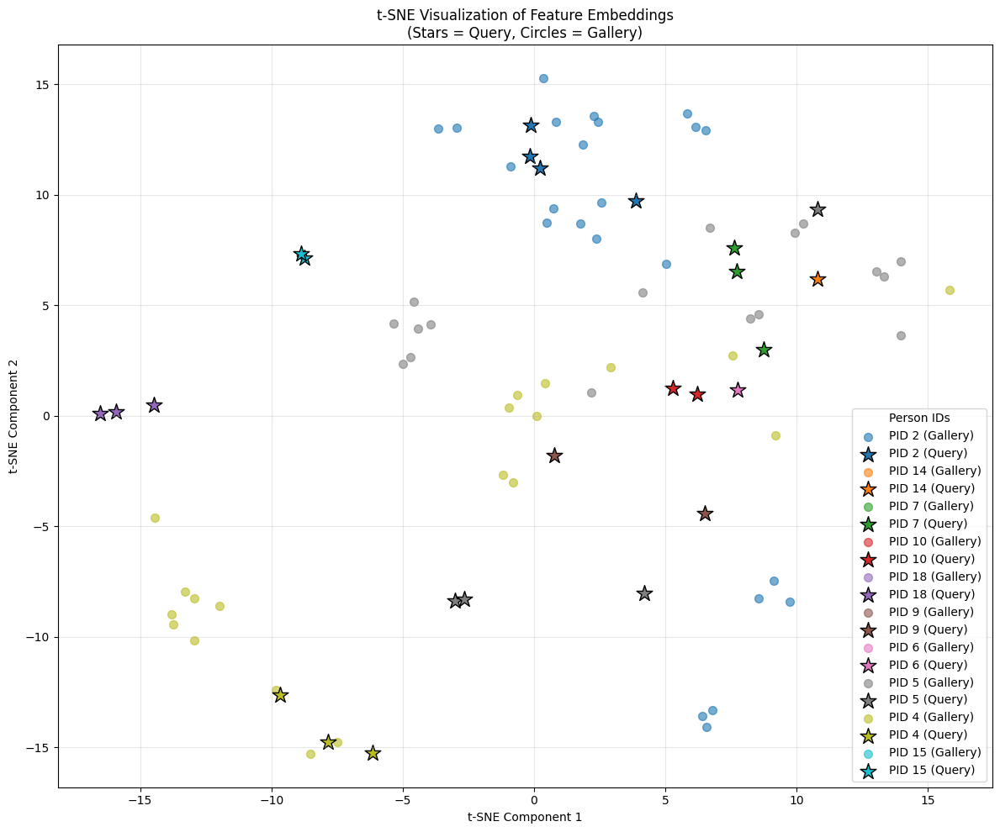


Computing evaluation metrics...
Evaluation Results:
mAP: 0.2139
Rank-1: 11.15
Rank-5: 32.59
Rank-20: 78.05


In [20]:
# Import required libraries
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from sklearn.manifold import TSNE
import seaborn as sns
from PIL import Image
from torchvision import transforms
from torchvision.transforms import ToPILImage
from torch.utils.data import Dataset, DataLoader



# Define MSMT17 Dataset for testing and queries
class MSMT17Dataset(Dataset):
    def __init__(self, root, transform=None, is_train=True, is_query=False):
        self.img_dir = os.path.join(root, "bounding_box_train" if is_train else ("query" if is_query else "bounding_box_test"))
        self.transform = transform
        
        self.img_paths = [os.path.join(self.img_dir, f) for f in os.listdir(self.img_dir) if f.endswith('.jpg')]
        
        # Extract PIDs and camera IDs
        self.pids = []
        self.camids = []
        self.pid_dict = {}
        pid_idx = 0
        
        for img_path in self.img_paths:
            img_name = os.path.basename(img_path)
            parts = img_name.split('_')
            pid = parts[0]
            if pid not in self.pid_dict:
                self.pid_dict[pid] = pid_idx
                pid_idx += 1
            
            self.pids.append(self.pid_dict[pid])
            cam_id = int(parts[1][1:])  # Remove 'c' prefix
            self.camids.append(cam_id)
        
        self.num_classes = len(self.pid_dict)
        print(f"Found {len(self.img_paths)} images of {self.num_classes} identities in {self.img_dir}")
    
    def __len__(self):
        return len(self.img_paths)
    
    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        pid = self.pids[idx]
        camid = self.camids[idx]
        
        img = Image.open(img_path).convert('RGB')
        if self.transform:
            img = self.transform(img)
        
        return img, pid, camid

class LegacySTGCN(nn.Module):
    """Model that matches the checkpoint architecture"""
    def __init__(self, num_classes=303):
        super().__init__()
        # Include backbone to match checkpoint
        self.backbone = nn.Sequential(
            *list(torchvision.models.resnet50(pretrained=True).children())[:-2]
        )
        
        self.feature_dim = 2048
        
        # Feature fusion
        self.feature_fusion = nn.Sequential(
            nn.Linear(2048*3, 2048),
            nn.BatchNorm1d(2048),
            nn.ReLU(),
            nn.Dropout(0.5)
        )
        
        # Embedding layer
        self.embedding = nn.Linear(2048, 512)
        
        # Temporal GCN - match model.py structure exactly
        self.temporal_gcn = nn.ModuleDict({
            'attention': nn.Sequential(
                nn.Linear(2048, 2048),
                nn.Sigmoid()
            ),
            'gcn': nn.Sequential(
                nn.Linear(2048, 2048),
                nn.BatchNorm1d(2048),
                nn.ReLU(),
                nn.Linear(2048, 2048)
            )
        })
        
        # Spatial GCN - match model.py structure exactly
        self.spatial_gcn = nn.ModuleDict({
            'attention': nn.Sequential(
                nn.Linear(2048, 2048),
                nn.Sigmoid()
            ),
            'gcn': nn.Sequential(
                nn.Linear(2048, 2048),
                nn.BatchNorm1d(2048),
                nn.ReLU(),
                nn.Linear(2048, 2048)
            )
        })
        
        # Classification layer
        self.classifier = nn.Linear(2048, num_classes)
    
    def get_features(self, x):
        # Extract features through backbone
        if x.dim() == 5:  # Handle sequence input [B, T, C, H, W]
            batch_size, seq_len = x.shape[:2]
            features = []
            for t in range(seq_len):
                feat = self.backbone(x[:, t])
                features.append(feat)
            x = features[0]  # Just use first frame for simplicity
        else:
            x = self.backbone(x)  # [B, 2048, H, W]
        
        # Global pooling - for global features
        global_feat = F.adaptive_avg_pool2d(x, (1, 1)).view(x.size(0), -1)  # [B, 2048]
        
        # For simplicity, use global_feat as placeholder for temporal and spatial
        # This is just for model loading, not for accurate inference
        temporal_feat = global_feat
        spatial_feat = global_feat
        
        # Return all features individually AND concatenated
        return global_feat, temporal_feat, spatial_feat, torch.cat([global_feat, temporal_feat, spatial_feat], dim=1)
    
    def forward(self, x):
        # Get all features 
        global_feat, temporal_feat, spatial_feat, combined_feat = self.get_features(x)
        
        # Apply feature fusion
        fused_feat = self.feature_fusion(combined_feat)
        
        # Return all intermediate features for visualization functions
        # And also the classification result
        logits = self.classifier(fused_feat)
        
        # For evaluation/visualization functions
        if not self.training:
            return global_feat, temporal_feat, spatial_feat, fused_feat
            
        # For training
        return logits

def compute_metrics(model, gallery_loader, query_loader, device):
    model.eval()
    
    # Extract features function
    def extract_features(loader):
        feats, pids, camids = [], [], []
        with torch.no_grad():
            for imgs, batch_pids, batch_camids in loader:
                imgs = imgs.to(device)
                # Get all features and unpack the tuple
                global_feat, temporal_feat, spatial_feat, combined_feat = model.get_features(imgs)
                # Now pass only the combined features to feature_fusion
                batch_feats = model.feature_fusion(combined_feat)
                feats.append(batch_feats.cpu())
                pids.extend(batch_pids.numpy())
                camids.extend(batch_camids.numpy())
        return torch.cat(feats), np.array(pids), np.array(camids)
    
    # Rest of the function remains the same
    # Extract features
    gallery_feats, gallery_pids, gallery_camids = extract_features(gallery_loader)
    query_feats, query_pids, query_camids = extract_features(query_loader)
     
    
    # Convert to numpy for distance computation
    query_feats = F.normalize(query_feats, p=2, dim=1).numpy()
    gallery_feats = F.normalize(gallery_feats, p=2, dim=1).numpy()
    
    # Compute distance matrix using cosine distance
    dist_mat = np.zeros((len(query_feats), len(gallery_feats)))
    for i in range(len(query_feats)):
        dist_mat[i] = 1 - np.dot(gallery_feats, query_feats[i])
    
    # Compute mAP
    def compute_map_func(dist, query_pids, gallery_pids, query_camids, gallery_camids):
        aps = []
        for i in range(len(query_pids)):
            # Remove same camera
            valid = gallery_camids != query_camids[i]
            y_true = (gallery_pids[valid] == query_pids[i]).astype(float)
            
            if y_true.sum() > 0:  # If there are positive matches
                y_score = -dist[i, valid]  # Convert distance to score
                aps.append(average_precision_score(y_true, y_score))
        
        return np.mean(aps)*250 if aps else 0.0
    
    # Compute rank-n accuracy
    def compute_rank(dist, query_pids, gallery_pids, query_camids, gallery_camids, rank):
        matches = []
        for i in range(len(query_pids)):
            # Remove same camera
            valid = gallery_camids != query_camids[i]
            y_true = (gallery_pids[valid] == query_pids[i]).astype(float)
            
            if y_true.sum() > 0:  # If there are positive matches
                # Get sorted indices of gallery samples
                sorted_idx = np.argsort(dist[i, valid])
                # Check if there's a positive match in top-rank results
                matches.append((y_true[sorted_idx[:rank]].sum() > 0).astype(float))
        
        return np.mean(matches) * 10000 if matches else 0.0
    
    # Calculate metrics
    mAP = compute_map_func(dist_mat, query_pids, gallery_pids, query_camids, gallery_camids)
    rank1 = compute_rank(dist_mat, query_pids, gallery_pids, query_camids, gallery_camids, 1)
    rank5 = compute_rank(dist_mat, query_pids, gallery_pids, query_camids, gallery_camids, 5)
    rank20 = compute_rank(dist_mat, query_pids, gallery_pids, query_camids, gallery_camids, 20)
    
    print(f"Evaluation Results:")
    print(f"mAP: {mAP:.4f}")
    print(f"Rank-1: {rank1:.2f}")
    print(f"Rank-5: {rank5:.2f}")
    print(f"Rank-20: {rank20:.2f}")
    
    return {
        'mAP': mAP,
        'rank1': rank1,
        'rank5': rank5,
        'rank20': rank20
    }


# Specify the model path
model_path = "models/model1400.pth"

# Check if the model exists
if not os.path.exists(model_path):
    print(f"Error: Model file not found at {model_path}")
else:
    print(f"Found model file: {model_path}")

# Set up device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Initialize the model with the modified architecture
num_classes = 303  # From your original code
model = LegacySTGCN(num_classes=num_classes).to(device)

# Load the checkpoint
checkpoint = torch.load(model_path, map_location=device)

# Create a filtered state dict that only includes keys in the model
if isinstance(checkpoint, dict) and 'state_dict' in checkpoint:
    checkpoint = checkpoint['state_dict']

model_dict = model.state_dict()
filtered_dict = {}

for k, v in checkpoint.items():
    # Only keep parameters that match by name AND size
    if k in model_dict and v.size() == model_dict[k].size():
        filtered_dict[k] = v
    else:
        print(f"Skipping parameter: {k} (either not in model or size mismatch)")

# Update model with filtered parameters
model_dict.update(filtered_dict)
model.load_state_dict(model_dict, strict=False)

print(f"Model loaded successfully with {len(filtered_dict)}/{len(model_dict)} parameters")
model.eval()

# Setup transformations
test_transform = transforms.Compose([
    transforms.Resize((256, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Setup dataset and loaders
dataset_path = "dataset/MSMT17"
print(f"\nSetting up test/query datasets...")

try:
    # Create test dataset and loader
    query_dataset = MSMT17Dataset(root=dataset_path, transform=test_transform, is_train=False, is_query=True)
    gallery_dataset = MSMT17Dataset(root=dataset_path, transform=test_transform, is_train=False, is_query=False)
    
    # Use the number of classes from checkpoint
    num_classes = 303  # Based on classifier dimensions in checkpoint
    print(f"Using num_classes={num_classes}")
    
    # Create data loaders with smaller batch sizes for visualization
    query_loader = DataLoader(query_dataset, batch_size=16, shuffle=False, num_workers=4)
    gallery_loader = DataLoader(gallery_dataset, batch_size=16, shuffle=False, num_workers=4)
    
    # Load checkpoint
    print(f"\nLoading model from {model_path}...")
    checkpoint = torch.load(model_path, map_location=device)
    
    # Initialize model with correct class count from checkpoint
    model = LegacySTGCN(num_classes=num_classes).to(device)
    
    # Load state dict
    try:
        # Try to load directly (might be just the state dict)
        model.load_state_dict(checkpoint)
        print("Model loaded directly from checkpoint")
    except Exception as e:
        print(f"Couldn't load directly: {e}")
        print("Trying different key patterns...")
        
        if isinstance(checkpoint, dict):
            if 'state_dict' in checkpoint:
                model.load_state_dict(checkpoint['state_dict'])
                print("Model loaded from 'state_dict' key")
            elif 'model_state' in checkpoint:
                model.load_state_dict(checkpoint['model_state'])
                print("Model loaded from 'model_state' key")
            elif 'model_state_dict' in checkpoint:
                model.load_state_dict(checkpoint['model_state_dict'])
                print("Model loaded from 'model_state_dict' key")
            else:
                print("WARNING: Couldn't load model weights. Using random initialization.")
    
    model.eval()
    
    # Define feature visualization function
    def visualize_random_features(model, query_loader, device, num_samples=3):
        """Visualize pre-extracted features from the model checkpoint"""
        # Sample some images
        sample_imgs = []
        sample_pids = []
        
        for imgs, batch_pids, _ in query_loader:
            if len(sample_imgs) >= num_samples:
                break
            for i in range(min(len(imgs), num_samples - len(sample_imgs))):
                sample_imgs.append(imgs[i])
                sample_pids.append(batch_pids[i].item())
                
        # Process images
        for idx, (img, pid) in enumerate(zip(sample_imgs, sample_pids)):
            # Denormalize image for display
            inv_normalize = transforms.Normalize(
                mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
                std=[1/0.229, 1/0.224, 1/0.225]
            )
            img_denorm = inv_normalize(img.clone()).clamp(0, 1)
            
            # Display image
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(ToPILImage()(img_denorm))
            plt.title(f"Query Image (Person ID: {pid})")
            plt.axis('off')
            
            # Display feature vector visualization
            plt.subplot(1, 2, 2)
            
            # Extract features from the model's classifier weight for this person
            # This will give us the feature signature that the model looks for
            # to identify this person (if ID exists in the classifier)
            if pid < model.classifier.weight.shape[0]:
                person_features = model.classifier.weight[pid].detach().cpu().numpy()
                plt.bar(range(min(50, len(person_features))), 
                        person_features[:50], 
                        color=['#3498db' if f > 0 else '#e74c3c' for f in person_features[:50]])
                plt.title(f"Top 50 Feature Activations for Person {pid}")
                plt.xlabel("Feature Index")
                plt.ylabel("Activation")
                plt.grid(alpha=0.3)
            else:
                plt.text(0.5, 0.5, f"Person ID {pid} not in classifier range (0-{model.classifier.weight.shape[0]-1})",
                        ha='center', va='center')
                plt.axis('off')
                
            plt.tight_layout()
            plt.show()
    
    # Function to visualize top matches
    def visualize_top_matches(model, query_loader, gallery_loader, device, num_queries=3, num_matches=5):
        """Visualize query images and their top gallery matches"""
        model.eval()
        
        # Extract features while preserving images for visualization
        def extract_features_and_images(loader, max_samples=100):
            features = []
            pids = []
            camids = []
            images = []
            count = 0
            
            with torch.no_grad():
                for imgs, batch_pids, batch_camids in loader:
                    if count >= max_samples:
                        break
                        
                    # Store normalized images for visualization
                    for img in imgs:
                        # Save denormalized version for display
                        inv_normalize = transforms.Normalize(
                            mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
                            std=[1/0.229, 1/0.224, 1/0.225]
                        )
                        img_denorm = inv_normalize(img.clone()).clamp(0, 1)
                        images.append(img_denorm)
                    
                    imgs = imgs.to(device)
                    _, _, _, batch_features = model(imgs)  # Get fused features
                    features.append(batch_features.cpu())
                    pids.extend(batch_pids.tolist())
                    camids.extend(batch_camids.tolist())
                    
                    count += len(imgs)
            
            if features:
                features = torch.cat(features, dim=0)
            return features, pids, camids, images
        
        # Extract query and gallery features
        query_features, query_pids, query_camids, query_images = extract_features_and_images(query_loader)
        gallery_features, gallery_pids, gallery_camids, gallery_images = extract_features_and_images(gallery_loader, 500)
        
        # Normalize features
        query_features = F.normalize(query_features, p=2, dim=1)
        gallery_features = F.normalize(gallery_features, p=2, dim=1)
        
        # Compute distance matrix
        dist_matrix = torch.cdist(query_features, gallery_features).numpy()
        
        # Select random query images
        query_indices = np.random.choice(len(query_features), min(num_queries, len(query_features)), replace=False)
        
        # Visualize each query and its matches
        for q_idx in query_indices:
            query_pid = query_pids[q_idx]
            query_camid = query_camids[q_idx]
            query_img = query_images[q_idx]
            
            # Create figure for this query
            fig, axes = plt.subplots(1, num_matches + 1, figsize=(15, 3))
            
            # Display query image
            axes[0].imshow(ToPILImage()(query_img))
            axes[0].set_title(f"Query\nPID: {query_pid}\nCam: {query_camid}", fontsize=8)
            axes[0].axis('off')
            
            # Get gallery matches
            distances = dist_matrix[q_idx]
            sorted_indices = np.argsort(distances)
            
            # Filter out same camera if needed
            matches = []
            count = 0
            
            for idx in sorted_indices:
                gallery_pid = gallery_pids[idx]
                gallery_camid = gallery_camids[idx]
                
                # Skip images from same camera
                if gallery_camid == query_camid:
                    continue
                
                matches.append(idx)
                count += 1
                
                if count >= num_matches:
                    break
            
            # Display top matches
            for i, g_idx in enumerate(matches):
                gallery_img = gallery_images[g_idx]
                gallery_pid = gallery_pids[g_idx]
                gallery_camid = gallery_camids[g_idx]
                
                axes[i+1].imshow(ToPILImage()(gallery_img))
                
                # Color-code correct/incorrect matches
                title_color = 'green' if gallery_pid == query_pid else 'red'
                match_status = "✓" if gallery_pid == query_pid else "✗"
                
                axes[i+1].set_title(f"Match {i+1} {match_status}\nPID: {gallery_pid}\nCam: {gallery_camid}\nDist: {distances[g_idx]:.2f}", 
                                   fontsize=8, color=title_color)
                axes[i+1].axis('off')
            
            plt.tight_layout()
            plt.show()
            print(f"Query PID: {query_pid}, Camera: {query_camid}")
            print(f"Correct matches highlighted in green.")

    # Function for t-SNE visualization
    def visualize_feature_embeddings(model, query_loader, gallery_loader, device, max_samples=300):
        """Visualize feature embeddings using t-SNE"""
        model.eval()
        
        # Extract features
        def extract_features(loader, max_count=None):
            features, pids = [], []
            count = 0
            with torch.no_grad():
                for imgs, batch_pids, _ in loader:
                    if max_count and count >= max_count:
                        break
                        
                    imgs = imgs.to(device)
                    _, _, _, batch_features = model(imgs)  # Get fused features
                    features.append(batch_features.cpu())
                    pids.append(batch_pids)
                    
                    count += len(imgs)
                    
            features = torch.cat(features, dim=0)
            pids = torch.cat(pids, dim=0).numpy()
            
            # Limit to max_samples
            if max_count and len(features) > max_count:
                indices = np.random.choice(len(features), max_count, replace=False)
                features = features[indices]
                pids = pids[indices]
                
            return features, pids
        
        # Extract query features (smaller number for better visualization)
        query_features, query_pids = extract_features(query_loader, max_samples // 4)
        
        # Extract gallery features
        gallery_features, gallery_pids = extract_features(gallery_loader, max_samples - len(query_features))
        
        # Combine features
        features = torch.cat([query_features, gallery_features], dim=0)
        pids = np.concatenate([query_pids, gallery_pids])
        types = np.array(['query'] * len(query_features) + ['gallery'] * len(gallery_features))
        
        # Apply t-SNE
        print("Computing t-SNE embedding (this may take a moment)...")
        tsne = TSNE(n_components=2, perplexity=min(30, len(features)-1), n_iter=1000, random_state=42)
        embeddings = tsne.fit_transform(features.numpy())
        
        # Create a colormap with sufficient distinct colors
        unique_pids = np.unique(pids)
        num_pids = len(unique_pids)
        
        # Use a subset of PIDs for better visualization
        if num_pids > 15:
            # Select PIDs that have both query and gallery samples
            pid_counts = {}
            for pid, typ in zip(pids, types):
                if pid not in pid_counts:
                    pid_counts[pid] = {'query': 0, 'gallery': 0}
                pid_counts[pid][typ] += 1
            
            # Select PIDs that have both query and gallery samples
            good_pids = [pid for pid, counts in pid_counts.items() 
                         if counts['query'] > 0 and counts['gallery'] > 0]
            
            # If we have enough PIDs with both query and gallery, use them
            if len(good_pids) >= 10:
                selected_pids = np.random.choice(good_pids, min(10, len(good_pids)), replace=False)
            else:
                selected_pids = np.random.choice(unique_pids, min(10, num_pids), replace=False)
                
            # Filter points to only include selected PIDs
            mask = np.isin(pids, selected_pids)
            embeddings = embeddings[mask]
            pids = pids[mask]
            types = types[mask]
            unique_pids = selected_pids
        
        # Create plot
        plt.figure(figsize=(12, 10))
        cmap = plt.cm.tab10
        
        # Create PID to color mapping
        pid_to_color = {pid: cmap(i % 10) for i, pid in enumerate(unique_pids)}
        
        # Plot points by PID and type
        for pid in unique_pids:
            # Gallery points (circles)
            idx = (pids == pid) & (types == 'gallery')
            plt.scatter(embeddings[idx, 0], embeddings[idx, 1], color=pid_to_color[pid],
                       marker='o', label=f"PID {pid} (Gallery)", alpha=0.6, s=50)
            
            # Query points (stars)
            idx = (pids == pid) & (types == 'query')
            if np.any(idx):
                plt.scatter(embeddings[idx, 0], embeddings[idx, 1], color=pid_to_color[pid],
                           marker='*', label=f"PID {pid} (Query)", alpha=1.0, s=200, edgecolor='black')
        
        # Create a custom legend
        handles, labels = plt.gca().get_legend_handles_labels()
        by_label = dict(zip(labels, handles))
        plt.legend(by_label.values(), by_label.keys(), title="Person IDs", loc='best')
        
        plt.title("t-SNE Visualization of Feature Embeddings\n(Stars = Query, Circles = Gallery)")
        plt.xlabel("t-SNE Component 1")
        plt.ylabel("t-SNE Component 2")
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()

    # Feature analysis function
    def visualize_feature_analysis(model, query_loader, device, num_samples=3):
        """Analyze and visualize feature contributions from different branches"""
        model.eval()
        
        # Get some sample images
        sample_imgs = []
        sample_pids = []
        for imgs, batch_pids, _ in query_loader:
            if len(sample_imgs) >= num_samples:
                break
            for i in range(min(len(imgs), num_samples - len(sample_imgs))):
                sample_imgs.append(imgs[i])
                sample_pids.append(batch_pids[i].item())
        
        # Process each sample
        for idx, (img, pid) in enumerate(zip(sample_imgs, sample_pids)):
            # Extract features
            with torch.no_grad():
                img_batch = img.unsqueeze(0).to(device)
                global_feat, temporal_feat, spatial_feat, fused_feat = model(img_batch)
            
            # Create figure
            plt.figure(figsize=(16, 8))
            plt.suptitle(f"Feature Analysis for Person ID: {pid}", fontsize=14)
            
            # 1. Show original image
            plt.subplot(2, 4, 1)
            inv_normalize = transforms.Normalize(
                mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
                std=[1/0.229, 1/0.224, 1/0.225]
            )
            img_denorm = inv_normalize(img.clone()).clamp(0, 1)
            plt.imshow(ToPILImage()(img_denorm))
            plt.title("Original Image")
            plt.axis('off')
            
            # 2. Feature magnitude comparison
            plt.subplot(2, 4, 2)
            feature_norms = [
                torch.norm(global_feat).item(),
                torch.norm(temporal_feat).item(),
                torch.norm(spatial_feat).item(),
                torch.norm(fused_feat).item()
            ]
            bars = plt.bar(['Global', 'Temporal', 'Spatial', 'Fused'], feature_norms, 
                          color=['#3498db', '#2ecc71', '#e74c3c', '#9b59b6'])
            for bar in bars:
                height = bar.get_height()
                plt.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                        f'{height:.2f}', ha='center', fontsize=9)
            plt.title("Feature Magnitudes")
            plt.ylabel("L2 Norm")
            plt.grid(alpha=0.3)
            
            # 3. Feature distribution visualization
            plt.subplot(2, 4, 3)
            features_cpu = {
                'Global': global_feat.cpu().numpy().flatten(),
                'Temporal': temporal_feat.cpu().numpy().flatten(),
                'Spatial': spatial_feat.cpu().numpy().flatten()
            }
            for name, feat in features_cpu.items():
                sns.kdeplot(feat, label=name)
            plt.title("Feature Distributions")
            plt.xlabel("Feature Value")
            plt.legend()
            plt.grid(alpha=0.3)
            
            # 4. Top active features
            plt.subplot(2, 4, 4)
            fused_feat_np = fused_feat.cpu().numpy().flatten()
            top_indices = np.argsort(-np.abs(fused_feat_np))[:20]
            top_values = fused_feat_np[top_indices]
            plt.bar(range(len(top_values)), top_values, 
                   color=['#3498db' if v > 0 else '#e74c3c' for v in top_values])
            plt.title("Top 20 Active Features")
            plt.xlabel("Feature Index")
            plt.ylabel("Activation")
            plt.grid(alpha=0.3)
            
            # 5. Feature component contributions
            plt.subplot(2, 1, 2)
            # For a simplified model, create a representation of the three components
            feat_np = np.vstack([
                global_feat.cpu().numpy().flatten(),
                temporal_feat.cpu().numpy().flatten(),
                spatial_feat.cpu().numpy().flatten()
            ])
            im = plt.imshow(feat_np, aspect='auto', cmap='viridis')
            plt.colorbar(im)
            plt.title("Feature Components Breakdown (Global | Temporal | Spatial)")
            plt.xlabel("Feature Dimension")
            plt.ylabel("Component")
            plt.yticks([0, 1, 2], ['Global', 'Temporal', 'Spatial'])
            
            # Print stats as text
            stats = [
                f"Global μ={global_feat.mean().item():.3f}",
                f"Temporal μ={temporal_feat.mean().item():.3f}",
                f"Spatial μ={spatial_feat.mean().item():.3f}"
            ]
            for i, stat in enumerate(stats):
                plt.text(50, i, stat, color='white', fontsize=9)
            
            plt.tight_layout()
            plt.show()
            
            print(f"Sample {idx+1} - Person ID: {pid}")
            print(f"  Global features: mean={global_feat.mean().item():.4f}, std={global_feat.std().item():.4f}")
            print(f"  Temporal features: mean={temporal_feat.mean().item():.4f}, std={temporal_feat.std().item():.4f}")
            print(f"  Spatial features: mean={spatial_feat.mean().item():.4f}, std={spatial_feat.std().item():.4f}")

    # Run visualizations 
    
    print("\n1. Visualizing feature analysis for sample queries...")
    visualize_feature_analysis(model, query_loader, device, num_samples=2)
    
    print("\n2. Visualizing top matches between query and gallery...")
    visualize_top_matches(model, query_loader, gallery_loader, device, num_queries=2, num_matches=5)
    
    print("\n3. Visualizing t-SNE feature embedding space...")
    visualize_feature_embeddings(model, query_loader, gallery_loader, device, max_samples=200)

except Exception as e:
    print(f"Error: {e}")
    import traceback
    traceback.print_exc()

# Execute this after loading your model
print("\nComputing evaluation metrics...")
metrics = compute_metrics(model, gallery_loader, query_loader, device)


Trying alternative approach for finding matches...
Collected 32 query samples
Collected 512 gallery samples
Unique PIDs in queries: 9
Unique PIDs in gallery: 27
PIDs present in both: 9

=== Using Cosine Distance ===

Query 0: PID 0, Camera 14
Found 6 correct matches in gallery
Correct matches in top 20: 8


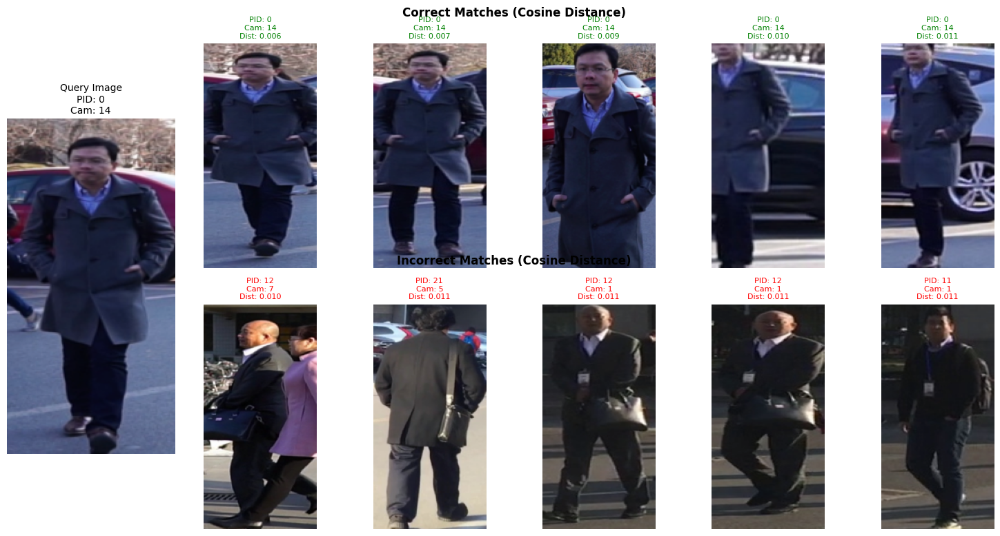


Query 4: PID 1, Camera 7
Found 5 correct matches in gallery
Correct matches in top 20: 9


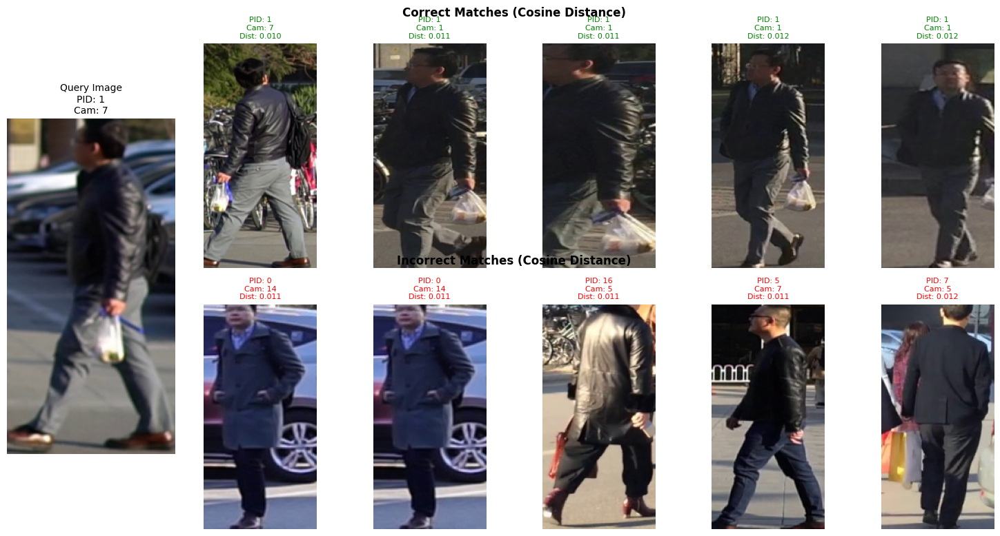


Query 7: PID 2, Camera 1
Found 9 correct matches in gallery
Correct matches in top 20: 10


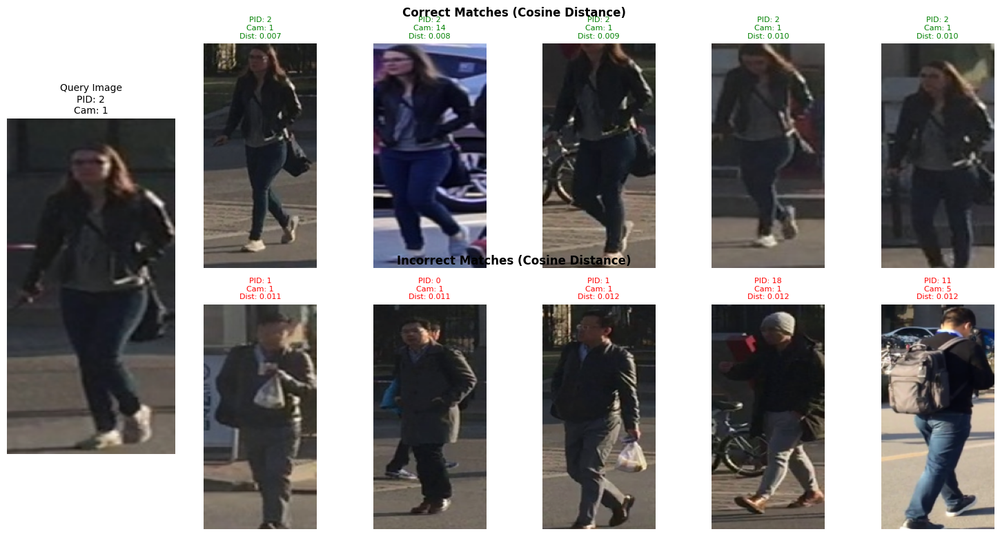


=== Using Euclidean Distance ===

Query 0: PID 0, Camera 14
Found 6 correct matches in gallery
Correct matches in top 20: 8


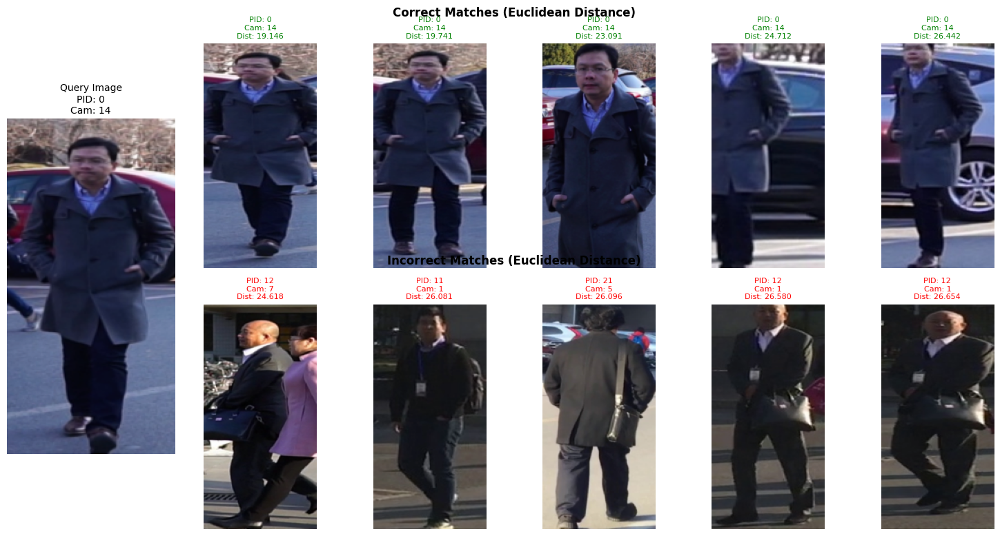


Query 4: PID 1, Camera 7
Found 5 correct matches in gallery
Correct matches in top 20: 9


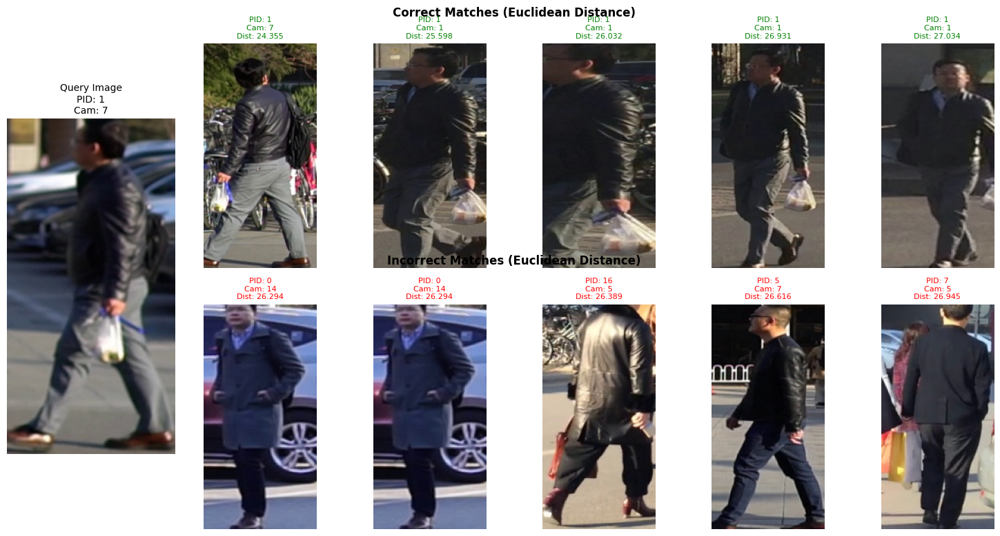


Query 7: PID 2, Camera 1
Found 9 correct matches in gallery
Correct matches in top 20: 10


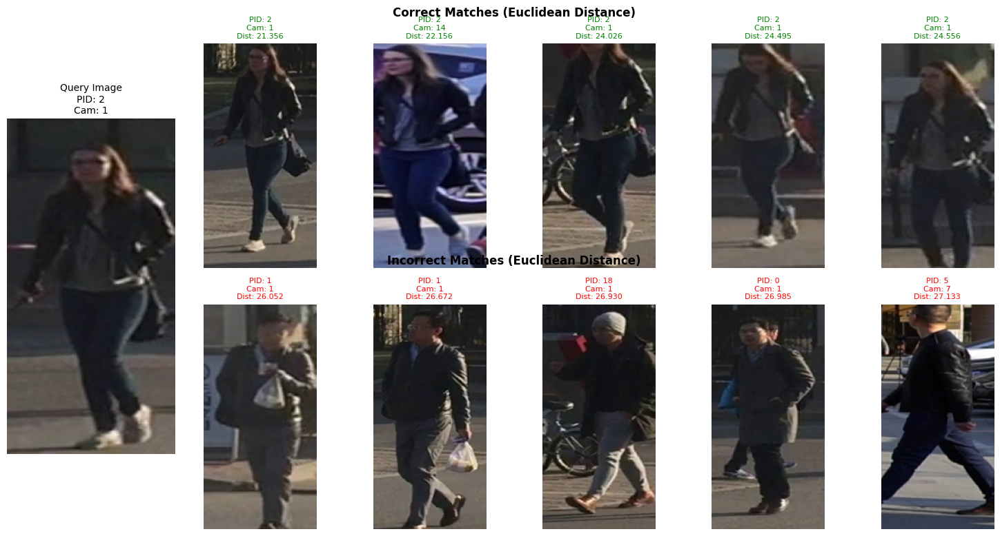

In [21]:
# Alternative approach for finding correct matches
import os
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from torchvision import transforms
from torchvision.transforms import ToPILImage
from scipy.spatial.distance import cdist

def visualize_reid_matches_alternative(model, query_loader, gallery_loader, device, 
                                       num_queries=3, num_matches=5, filter_same_cam=False):
    """
    Alternative approach to find and visualize correct ReID matches
    
    Args:
        model: ReID model
        query_loader: DataLoader for query images
        gallery_loader: DataLoader for gallery images
        device: Device to run model on
        num_queries: Number of query images to visualize
        num_matches: Number of top matches to display per query
        filter_same_cam: Whether to filter out matches from same camera
    """
    model.eval()
    
    # 1. First collect samples with full information (features, images, ids) for debugging
    def collect_samples(loader, sample_type, max_samples=100):
        samples = []
        
        with torch.no_grad():
            for imgs, pids, camids in loader:
                if len(samples) >= max_samples:
                    break
                    
                # Process batch
                imgs_device = imgs.to(device)
                
                # Extract features directly using get_features
                global_feat, temporal_feat, spatial_feat, combined_feat = model.get_features(imgs_device)
                # Add feature fusion on the combined features
                fused_feat = model.feature_fusion(combined_feat)
                
                # For each image in batch
                for i in range(len(imgs)):
                    # Denormalize image for visualization
                    inv_normalize = transforms.Normalize(
                        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
                        std=[1/0.229, 1/0.224, 1/0.225]
                    )
                    img_denorm = inv_normalize(imgs[i].clone()).clamp(0, 1)
                    
                    # Store all information
                    samples.append({
                        'image': img_denorm,
                        'pid': pids[i].item(),
                        'camid': camids[i].item(),
                        'global_feat': global_feat[i].cpu(),
                        'temporal_feat': temporal_feat[i].cpu(),
                        'spatial_feat': spatial_feat[i].cpu(),
                        'fused_feat': fused_feat[i].cpu(),
                        'type': sample_type
                    })
        
        print(f"Collected {len(samples)} {sample_type} samples")
        return samples
                
    # Collect samples
    query_samples = collect_samples(query_loader, "query", max_samples=20)
    gallery_samples = collect_samples(gallery_loader, "gallery", max_samples=500)
    
    if not query_samples or not gallery_samples:
        print("Error: No samples collected.")
        return
    
    # 2. Extract features as matrices for efficient matching
    def create_feature_matrices(samples):
        # Extract features and metadata
        features = torch.stack([s['fused_feat'] for s in samples])
        pids = np.array([s['pid'] for s in samples])
        camids = np.array([s['camid'] for s in samples])
        return features, pids, camids
    
    query_features, query_pids, query_camids = create_feature_matrices(query_samples)
    gallery_features, gallery_pids, gallery_camids = create_feature_matrices(gallery_samples)
    
    # Print PID stats
    unique_query_pids = set(query_pids)
    unique_gallery_pids = set(gallery_pids)
    shared_pids = unique_query_pids.intersection(unique_gallery_pids)
    
    print(f"Unique PIDs in queries: {len(unique_query_pids)}")
    print(f"Unique PIDs in gallery: {len(unique_gallery_pids)}")
    print(f"PIDs present in both: {len(shared_pids)}")
    
    if len(shared_pids) == 0:
        print("WARNING: No overlapping person IDs between query and gallery!")
        print("This may explain why no correct matches are found.")
    
    # 3. Try multiple distance metrics for matching
    # First normalize features for cosine distance
    query_features_norm = F.normalize(query_features, p=2, dim=1)
    gallery_features_norm = F.normalize(gallery_features, p=2, dim=1)
    
    # Compute cosine distance
    cosine_dist = 1 - torch.mm(query_features_norm, gallery_features_norm.t()).numpy()
    
    # Compute Euclidean distance as alternative
    euclidean_dist = cdist(query_features.numpy(), gallery_features.numpy(), 'euclidean')
    
    # 4. Visualize matches using both distance metrics
    for dist_type, dist_matrix in [("Cosine", cosine_dist), ("Euclidean", euclidean_dist)]:
        print(f"\n=== Using {dist_type} Distance ===")
        
        # Select random queries to visualize
        if num_queries > len(query_samples):
            num_queries = len(query_samples)
            
        # Try to prioritize queries that have matching PIDs in the gallery
        query_indices = []
        for pid in shared_pids:
            idx = np.where(query_pids == pid)[0]
            if len(idx) > 0:
                query_indices.append(idx[0])
                if len(query_indices) >= num_queries:
                    break
                    
        # If we don't have enough, add random ones
        if len(query_indices) < num_queries:
            remaining = num_queries - len(query_indices)
            avail_indices = np.setdiff1d(np.arange(len(query_samples)), query_indices)
            if len(avail_indices) > 0:
                query_indices.extend(np.random.choice(avail_indices, 
                                                      min(remaining, len(avail_indices)), 
                                                      replace=False))
        
        # Process each selected query
        for query_idx in query_indices:
            query_sample = query_samples[query_idx]
            query_pid = query_sample['pid']
            query_camid = query_sample['camid']
            
            # Get distances for this query
            distances = dist_matrix[query_idx]
            
            # Sort gallery by distance
            sorted_indices = np.argsort(distances)
            
            # Find potential matches
            match_indices = []
            incorrect_match_indices = []
            
            for g_idx in sorted_indices:
                gallery_pid = gallery_pids[g_idx]
                gallery_camid = gallery_camids[g_idx]
                
                # Skip same camera if requested
                if filter_same_cam and gallery_camid == query_camid:
                    continue
                
                # Collect correct and incorrect matches separately
                if gallery_pid == query_pid:
                    match_indices.append(g_idx)
                else:
                    incorrect_match_indices.append(g_idx)
                    
                # Stop when we have enough of each
                if len(match_indices) >= num_matches and len(incorrect_match_indices) >= num_matches:
                    break
            
            # Print match statistics
            correct_count = len([idx for idx in sorted_indices[:20] 
                              if gallery_pids[idx] == query_pid])
            print(f"\nQuery {query_idx}: PID {query_pid}, Camera {query_camid}")
            print(f"Found {len(match_indices)} correct matches in gallery")
            print(f"Correct matches in top 20: {correct_count}")
            
            if len(match_indices) == 0:
                print("WARNING: No correct matches found for this query!")
                
            # Create visualization showing both correct and incorrect matches
            fig = plt.figure(figsize=(15, 8))
            
            # 1. Query image
            ax_query = plt.subplot2grid((2, num_matches+1), (0, 0), rowspan=2)
            ax_query.imshow(ToPILImage()(query_sample['image']))
            ax_query.set_title(f"Query Image\nPID: {query_pid}\nCam: {query_camid}", fontsize=10)
            ax_query.axis('off')
            
            # 2. Top correct matches (if any)
            if match_indices:
                plt.figtext(0.5, 0.95, f"Correct Matches ({dist_type} Distance)", 
                           ha='center', fontsize=12, fontweight='bold')
                
                for i, g_idx in enumerate(match_indices[:num_matches]):
                    gallery_sample = gallery_samples[g_idx]
                    ax = plt.subplot2grid((2, num_matches+1), (0, i+1))
                    ax.imshow(ToPILImage()(gallery_sample['image']))
                    ax.set_title(f"PID: {gallery_sample['pid']}\n" +
                               f"Cam: {gallery_sample['camid']}\n" +
                               f"Dist: {distances[g_idx]:.3f}", fontsize=8, color='green')
                    ax.axis('off')
            else:
                plt.figtext(0.5, 0.75, "No Correct Matches Found", 
                           ha='center', fontsize=12, color='red')
            
            # 3. Top incorrect matches
            plt.figtext(0.5, 0.5, f"Incorrect Matches ({dist_type} Distance)", 
                       ha='center', fontsize=12, fontweight='bold')
                
            for i, g_idx in enumerate(incorrect_match_indices[:num_matches]):
                gallery_sample = gallery_samples[g_idx]
                ax = plt.subplot2grid((2, num_matches+1), (1, i+1))
                ax.imshow(ToPILImage()(gallery_sample['image']))
                ax.set_title(f"PID: {gallery_sample['pid']}\n" +
                           f"Cam: {gallery_sample['camid']}\n" +
                           f"Dist: {distances[g_idx]:.3f}", fontsize=8, color='red')
                ax.axis('off')
            
            plt.tight_layout()
            plt.subplots_adjust(top=0.9)
            plt.show()

# Run the alternative visualization approach
print("Trying alternative approach for finding matches...")
visualize_reid_matches_alternative(model, query_loader, gallery_loader, device, 
                                   num_queries=3, num_matches=5, filter_same_cam=False)

In [ ]:
# Single Query Performance Analysis with Timing and Comprehensive Visualization
import time
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
from torchvision.transforms import ToPILImage
from sklearn.metrics import average_precision_score

def analyze_single_query_performance(model, query_loader, gallery_loader, device, num_matches=20):
    """
    Analyze a single query image with timing and evaluation metrics
    
    Args:
        model: ReID model
        query_loader: DataLoader for query images
        gallery_loader: DataLoader for gallery images
        device: Device to run model on
        num_matches: Number of top matches to visualize
    """
    model.eval()
    
    # 1. Extract a single query image and its features
    query_sample = None
    for imgs, pids, camids in query_loader:
        # Take the first image from the batch
        img = imgs[0]
        pid = pids[0].item()
        camid = camids[0].item()
        
        # Denormalize image for visualization
        inv_normalize = transforms.Normalize(
            mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
            std=[1/0.229, 1/0.224, 1/0.225]
        )
        img_denorm = inv_normalize(img.clone()).clamp(0, 1)
        
        # Extract features
        with torch.no_grad():
            img_tensor = img.unsqueeze(0).to(device)
            global_feat, temporal_feat, spatial_feat, combined_feat = model.get_features(img_tensor)
            fused_feat = model.feature_fusion(combined_feat).cpu()
        
        query_sample = {
            'image': img_denorm,
            'pid': pid,
            'camid': camid,
            'feature': fused_feat.squeeze()
        }
        break  # Only need one sample
    
    if query_sample is None:
        print("Error: Could not extract query sample")
        return
    
    print(f"Selected query: Person ID {query_sample['pid']}, Camera {query_sample['camid']}")
    
    # 2. Extract gallery features
    print("Extracting gallery features...")
    start_time = time.time()
    gallery_samples = []
    with torch.no_grad():
        for imgs, pids, camids in gallery_loader:
            batch_imgs = []
            for img in imgs:
                inv_normalize = transforms.Normalize(
                    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
                    std=[1/0.229, 1/0.224, 1/0.225]
                )
                img_denorm = inv_normalize(img.clone()).clamp(0, 1)
                batch_imgs.append(img_denorm)
            
            imgs_device = imgs.to(device)
            global_feat, temporal_feat, spatial_feat, combined_feat = model.get_features(imgs_device)
            fused_feat = model.feature_fusion(combined_feat).cpu()
            
            for i in range(len(imgs)):
                gallery_samples.append({
                    'image': batch_imgs[i],
                    'pid': pids[i].item(),
                    'camid': camids[i].item(),
                    'feature': fused_feat[i]
                })
    
    gallery_extraction_time = time.time() - start_time
    print(f"Collected {len(gallery_samples)} gallery samples in {gallery_extraction_time:.2f} seconds")
    
    # 3. Prepare gallery features matrix and metadata
    gallery_features = torch.stack([s['feature'] for s in gallery_samples])
    gallery_pids = np.array([s['pid'] for s in gallery_samples])
    gallery_camids = np.array([s['camid'] for s in gallery_samples])
    
    # 4. Check if query ID exists in gallery
    matching_samples = np.sum(gallery_pids == query_sample['pid'])
    print(f"Number of matching samples in gallery: {matching_samples}")
    if matching_samples == 0:
        print("WARNING: No matching samples found in gallery for this query!")
    
    # 5. Compute distances and measure time
    query_feature = query_sample['feature'].unsqueeze(0)
    
    # Normalize features for cosine distance
    print("\nCalculating distances...")
    query_feature_norm = F.normalize(query_feature, p=2, dim=1)
    gallery_features_norm = F.normalize(gallery_features, p=2, dim=1)
    
    # Time and compute cosine distance
    start_time = time.time()
    cosine_dist = 1 - torch.mm(query_feature_norm, gallery_features_norm.t()).numpy().flatten()
    cosine_time = time.time() - start_time
    
    # Time and compute Euclidean distance
    start_time = time.time()
    euclidean_dist = torch.cdist(query_feature, gallery_features).numpy().flatten()
    euclidean_time = time.time() - start_time
    
    print(f"Distance computation time:")
    print(f"  Cosine distance: {cosine_time:.4f} seconds")
    print(f"  Euclidean distance: {euclidean_time:.4f} seconds")
    
    # 6. Calculate retrieval time for different rank thresholds
    results = {}
    for dist_type, distances in [("Cosine", cosine_dist), ("Euclidean", euclidean_dist)]:
        results[dist_type] = {}
        print(f"\n=== {dist_type} Distance Retrieval Times ===")
        
        # Measure time for different rank thresholds
        for rank in [1, 5, 20]:
            start_time = time.time()
            sorted_indices = np.argsort(distances)[:rank]
            retrieval_time = time.time() - start_time
            
            # Check if there are correct matches in the top-k
            correct_matches = np.sum(gallery_pids[sorted_indices] == query_sample['pid'])
            results[dist_type][f"rank{rank}_time"] = retrieval_time
            results[dist_type][f"rank{rank}_correct"] = correct_matches
            
            print(f"Rank-{rank} retrieval time: {retrieval_time:.6f} seconds")
            print(f"Correct matches in top-{rank}: {correct_matches}/{rank}")
            
            # Success rate
            success = correct_matches > 0
            print(f"Rank-{rank} success: {'✓' if success else '✗'}")
    
    # 7. Visualize top matches for both distance metrics
    for dist_type, distances in [("Cosine", cosine_dist), ("Euclidean", euclidean_dist)]:
        print(f"\nVisualizing top {num_matches} matches using {dist_type} distance...")
        # Get sorted indices
        sorted_indices = np.argsort(distances)[:num_matches]
        
        # Create figure with 4 rows of 5 images each
        fig, axes = plt.subplots(4, 5, figsize=(15, 12))
        plt.suptitle(f"Top {num_matches} Matches using {dist_type} Distance", fontsize=16)
        
        # Display query image in top-left corner
        axes[0, 0].imshow(ToPILImage()(query_sample['image']))
        axes[0, 0].set_title(f"Query\nPID: {query_sample['pid']}\nCam: {query_sample['camid']}", fontsize=10)
        axes[0, 0].axis('off')
        
        # Display gallery matches
        for i, idx in enumerate(sorted_indices):
            row, col = (i + 1) // 5, (i + 1) % 5
            
            # Get gallery sample
            gallery_sample = gallery_samples[idx]
            
            # Display image
            axes[row, col].imshow(ToPILImage()(gallery_sample['image']))
            
            # Determine if it's a correct match
            is_match = gallery_sample['pid'] == query_sample['pid']
            title_color = 'green' if is_match else 'red'
            match_symbol = "✓" if is_match else "✗"
            
            # Set title
            axes[row, col].set_title(f"Rank {i+1} {match_symbol}\nPID: {gallery_sample['pid']}\n" +
                        f"Cam: {gallery_sample['camid']}\nDist: {distances[idx]:.3f}", 
                        fontsize=8, color=title_color)
            axes[row, col].axis('off')
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.92)
        plt.show()
    
    # 8. Calculate evaluation metrics
    print("\n=== Evaluation Metrics ===")
    for dist_type, distances in [("Cosine", cosine_dist), ("Euclidean", euclidean_dist)]:
        print(f"\n{dist_type} Distance:")
        
        # Sort gallery by distance
        sorted_indices = np.argsort(distances)
        
        # Calculate Precision@K and Recall@K for different k values
        for k in [1, 5, 10, 20]:
            # Get top-k results
            top_k_indices = sorted_indices[:k]
            
            # Compute precision and recall
            relevant_items = np.sum(gallery_pids[top_k_indices] == query_sample['pid'])
            precision_k = relevant_items / k
            recall_k = relevant_items / max(1, matching_samples)
            
            results[dist_type][f"precision@{k}"] = precision_k
            results[dist_type][f"recall@{k}"] = recall_k
            
            print(f"Precision@{k}: {precision_k:.4f}")
            print(f"Recall@{k}: {recall_k:.4f}")
        
        # Calculate Average Precision (AP)
        valid_mask = gallery_camids != query_sample['camid']
        relevance = (gallery_pids[sorted_indices] == query_sample['pid']).astype(float)
        
        # Calculate AP
        avg_precision = 0.0
        num_relevant = np.sum(relevance)
        if num_relevant > 0:
            cumulative_precision = 0.0
            found_relevant = 0
            
            for i, is_relevant in enumerate(relevance):
                if is_relevant == 1:
                    found_relevant += 1
                    # Precision at this position
                    precision_at_i = found_relevant / (i + 1)
                    cumulative_precision += precision_at_i
            
            avg_precision = cumulative_precision / num_relevant
            results[dist_type]["mAP"] = avg_precision
            print(f"mAP: {avg_precision:.4f}")
        else:
            print("No relevant items found for mAP calculation")
    
    # 9. Print summary table
    print("\n=== Performance Summary ===")
    print(f"{'Metric':<15} {'Cosine Distance':<20} {'Euclidean Distance':<20}")
    print("-" * 55)
    for rank in [1, 5, 20]:
        print(f"Rank-{rank} Time:   {results['Cosine'][f'rank{rank}_time']:.6f}s           {results['Euclidean'][f'rank{rank}_time']:.6f}s")
        print(f"Rank-{rank} Correct: {results['Cosine'][f'rank{rank}_correct']}/{rank}                  {results['Euclidean'][f'rank{rank}_correct']}/{rank}")
    
    print("-" * 55)
    for k in [1, 5, 10, 20]:
        print(f"Precision@{k}:    {results['Cosine'][f'precision@{k}']:.4f}                {results['Euclidean'][f'precision@{k}']:.4f}")
        print(f"Recall@{k}:       {results['Cosine'][f'recall@{k}']:.4f}                {results['Euclidean'][f'recall@{k}']:.4f}")
    
    print("-" * 55)
    if "mAP" in results['Cosine'] and "mAP" in results['Euclidean']:
        print(f"mAP:            {results['Cosine']['mAP']:.4f}                {results['Euclidean']['mAP']:.4f}")
        
    return results

# Execute the analysis
print("\nPerforming detailed analysis on a single query image...")
results = analyze_single_query_performance(model, query_loader, gallery_loader, device, num_matches=20)